# Homework 2

## Consegna

 ### 1. Metodo del gradiente

Estendere a funzioni in pi`u variabili:

$f:R^n → R$

la funzione che implementa il metodo di discesa del gradiente (GD) vista
a lezione applicata ad una funzione di una singola variabile, che possa
utilizzare sia il passo fisso che quello variabile calcolato con la funzione
di backtracking. Per i criteri di arresto si propongono (ma si possono
diminuire) i seguenti valori per le tolleranze: tolleranza sul gradiente $10^{-6}$
e sulla differenza fra iterati $10^{-5}$ e un numero massimo di iterazioninon
inferiore a 8000.



Date le funzioni $f:R^n → R$

(a). $f(x_1, x_2) = (x_1 − 5)^2 + (x_2 − 2)^2 $, minimo in $(5,2)$



(b) funzione di Rosenbrock:

$f(x_1, x_2) = (1 − x_1)^2 + 100(x_2 − x_1^2)^2 $, minimo globale in $(1,1)$
passo fisso di $α=0.01,0.005,0.001$ 



(c) funzione multimodale:
$f(x_1, x_2) = x_1^4 -x_1^2+x_2^2 $, minimi in $(-1/√2,0), (1/√2,0)$, massimo in $(0,0)$

punto iniziale:$(0.5,1), (-0.5,-1),(0.1,0.2)$

passo fisso e backtracking.


(d) Minimi quadrati lineari:
$f(x) = 1/2 ||Ax−b||_2 ^2$ dove $A ∈ R^{n×n}$ e una
matrice con elementi casuali (ottenuti con la funzione numpy.random.random)
oppure la matrice di Vandermonde (ottenuta con la funzione numpy.vander)
associata al vettore $v ∈ R^n$ che contiene n valori equispaziati nell’intervallo
$[0,1]$ e  $b ∈ R^n$ e calcolato ponendo $x^* =  (1, 1, . . . , 1)^T $ e $ b = Ax^*$

(e) Minimi quadrati con regolarizzazione:
$f(x) = 1/2 ||Ax−b||_2 ^2 + λ||x||_2^2,  λ ∈[0,1]$ con la stessa matrice e etermine noto precedente.

(f) $f(x) = \sum_{i=1}^{n} (x_i-i)^2  - \sum_{i=1}^{n} ln(x_i) , x_i >0$

Soluzione esatta:
$$x_i^* = \frac{i + \sqrt{i^2 + 2}}{2}, \quad i = 1, \ldots n$$

(g) $f(x) = \sum_{i=1}^{n} (x_i-b_i)^2  +c \sum_{i=1}^{n} ln(x_i) , x_i >0$

Soluzione esatta:
$$x_i^* = \frac{b_i + \sqrt{b_i^2 - 2c}}{2}, \quad i = 1, \ldots n$$

Testare su almeno 4 delle funzioni precedenti cosi scelte:

(a) una funzione scelta fra 1) e 3)

(b) La funzione 2)

(c) una funzione scelta fra 4) e 5)

(d) una funzione scelta fra 6) e 7)


### 2. Metodo del gradiente stocastico
Implementare la versione stocastica del metodo del gradiente e confrontare
i risultati con il metodo del gradiente su una o due delle funzioni d)-g)
i a scelta. In particolare confrontare i grafici dell’errore relativo e della
del valore della funzione obiettivo al variare delle iterazioni, per diversa
dimensione del minibatch.


## Codici degli algoritmi

Backtracking

In [1431]:
import numpy as np
import matplotlib.pyplot as plt

In [1432]:


def backtracking(f, xk, grad_k, rho=0.5, c=1e-4):
    """
    Backtracking per funzioni a n variabili
    
    Parametri:
    - f: funzione obiettivo
    - xk: punto attuale (vettore n-dimensionale)
    - grad_k: gradiente nel punto attuale (vettore n-dimensionale)
    - rho: fattore di riduzione dello step (default 0.5)
    - c: costante di Armijo (default 1e-4)
    
    Return:
    - alpha: passo scalare calcolato con la condizione di Armijo
    """
    alpha = 0.5
    fk = f(xk)
    pk = -grad_k  # Direzione di discesa
    
    # Ciclo di backtracking: riduce alpha finché non è soddisfatta la condizione di Armijo
    # f(x_k + alpha * p_k) <= f(x_k) + c * alpha * grad_k^T * p_k
    while f(xk + alpha * pk) > fk + c * alpha * np.dot(grad_k, pk):
        alpha = alpha * rho
        if alpha < 1e-16:  # Tolleranza per evitare underflow numerico
            break
    
    return alpha

Metodo del Gradiente

In [1433]:
def GD(f, df, x0, x_true, alpha, maxit=8000, tolf=1e-6, tolx=1e-5, use_backtracking=False):
    """
    Metodo del gradiente per funzioni multivariabili
    
    Parametri:
    - f: funzione obiettivo
    - df: gradiente della funzione
    - x0: punto iniziale
    - x_true: soluzione esatta (per calcolare l'errore)
    - alpha: passo fisso (o passo iniziale se use_backtracking=True)
    - maxit: numero massimo di iterazioni
    - tolf: tolleranza sul gradiente
    - tolx: tolleranza sulla differenza fra iterati
    - use_backtracking: se True usa backtracking, altrimenti passo fisso
    
    Return:
    - x: punto di minimo trovato
    - rel_err: errore relativo ad ogni iterazione
    - val: valore della funzione ad ogni iterazione
    - grad_norm: norma del gradiente ad ogni iterazione
    """
    # Inizializzazione
    k = 0
    rel_err = np.zeros((maxit+1, ))
    val = np.zeros((maxit+1, ))
    grad_norm = np.zeros((maxit+1, ))
    x_history = [x0.copy()]    
    x = x0.copy()
    
    # Ciclo iterativo
    condizione = True
    while condizione:
        # Calcolo del gradiente
        grad = df(x)
        
        # Salvataggio metriche
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        grad_norm[k] = np.linalg.norm(grad)
        
        # Calcolo del passo
        if use_backtracking:
            alpha_k = backtracking(f, x, grad)
        else:
            alpha_k = alpha
        
        # Aggiornamento x_{k+1} = x_k - alpha_k * df(x_k)
        x_new = x - alpha_k * grad
        
        # Check condizioni di arresto
        condizione = (k < maxit) and (np.linalg.norm(grad) > tolf) and (np.linalg.norm(x_new - x) > tolx)
        
        # Preparazione per step successivo
        k = k + 1
        x = x_new
        x_history.append(x.copy())

    # Salvataggio ultima iterazione
    if k < maxit + 1:
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        grad_norm[k] = np.linalg.norm(df(x))
        k = k + 1
    
    # Tagliare i valori inutilizzati
    rel_err = rel_err[:k]
    val = val[:k]
    grad_norm = grad_norm[:k]

    return x, rel_err, val, grad_norm, k, np.array(x_history)

Metodo del gradiente stocastico

In [1434]:
def SGD(f, df_i, x0, x_true, n, alpha, maxit=20000, tolf=1e-6, tolx=1e-5, batch_size=1, lr_schedule='fixed'):
    """
    Metodo del gradiente stocastico con learning rate decrescente
    
    Parametri:
    - f: funzione obiettivo
    - df_i: funzione che calcola il gradiente della i-esima componente
    - x0: punto iniziale
    - x_true: soluzione esatta
    - n: numero totale di componenti
    - alpha: passo iniziale
    - maxit: numero massimo di iterazioni
    - tolf: tolleranza sul gradiente
    - tolx: tolleranza sulla differenza fra iterati
    - batch_size: dimensione del minibatch
    - lr_schedule: 'decay' (alpha_k = alpha/sqrt(k+1)) o 'fixed' (alpha costante)
    
    Return:
    - x: punto di minimo trovato
    - rel_err: errore relativo ad ogni iterazione
    - val: valore della funzione ad ogni iterazione
    - grad_norm: norma del gradiente stimato ad ogni iterazione
    """
    # Inizializzazione
    k = 0
    rel_err = np.zeros((maxit+1, ))
    val = np.zeros((maxit+1, ))
    grad_norm = np.zeros((maxit+1, ))
    
    x = x0.copy()
    x_history = [x.copy()]
    
    # Ciclo iterativo
    condizione = True
    while condizione:
        # Salvataggio metriche
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        
        # Selezione casuale del minibatch
        indices = np.random.choice(n, size=batch_size, replace=False)
        
        # Calcolo del gradiente stocastico (media dei gradienti nel minibatch)
        grad_stoch = np.zeros_like(x)
        for i in indices:
            grad_stoch += df_i(x, i)
        grad_stoch = grad_stoch / batch_size
        
        grad_norm[k] = np.linalg.norm(grad_stoch)
        
        # Learning rate adattivo
        if lr_schedule == 'decay':
            alpha_k = alpha / np.sqrt(k + 1)
        else:
            alpha_k = alpha
        
        # Aggiornamento
        x_new = x - alpha_k * grad_stoch
        
        # Check condizioni di arresto
        condizione = (k < maxit) and (np.linalg.norm(grad_stoch) > tolf) and (np.linalg.norm(x_new - x) > tolx)
        
        # Preparazione per step successivo
        k = k + 1
        x = x_new
        x_history.append(x.copy()) # Salviamo il nuovo punto

    
    # Salvataggio ultima iterazione
    if k < maxit + 1:
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        k = k + 1
    
    # Tagliare i valori inutilizzati
    rel_err = rel_err[:k]
    val = val[:k]
    grad_norm = grad_norm[:k]
    
    
    return x, rel_err, val, grad_norm, k, np.array(x_history)

## Conclusioni

Il notebook implementa:

1. **Metodo del gradiente (GD)** per funzioni multivariabili con:
   - Passo fisso
   - Passo variabile con backtracking

2. **Metodo del gradiente stocastico (SGD)** con minibatch configurabile

3. **Test su 4 funzioni diverse**:
   - (a) Funzione quadratica semplice
   - (b) Funzione di Rosenbrock (difficile, mal condizionata)
   - (d) Minimi quadrati lineari
   - (f) Funzione con logaritmi

4. **Confronto GD vs SGD** su funzioni (d) ed (e) con diverse dimensioni di batch

I risultati mostrano che:
- Il backtracking generalmente converge più velocemente del passo fisso
- La funzione di Rosenbrock richiede molte iterazioni e passi molto piccoli
- SGD con batch piccoli è più rumoroso ma può essere più veloce per funzioni con molte componenti
- All'aumentare della dimensione del batch, SGD si avvicina al comportamento di GD

Metodo per stampare le curve di livello

In [1435]:
#stampo la funzione, e le sue curve di livello se sono 2D

def plot_3d_universal(f, xtrue, xn=None, x1_limits=(-10, 10), x2_limits=(-10, 10), title_prefix="Grafico"):
    
    
    # --- CONTROLLO DIMENSIONALE ---
    if xn is not None:
        # Assumiamo xn sia un numpy array shape (n,)
        if xn.shape[0] > 2:
            print(f"[{title_prefix}] Skipping plot: Dimensione input N={xn.shape[0]} > 2 (impossibile visualizzare in 3D)")
            return
        else:
            print(f"[{title_prefix}] Plotting consentito: Dimensione input N={xn.shape[0]}")

    # 1. Creazione griglia
    x1_range = np.linspace(x1_limits[0], x1_limits[1], 100) 
    x2_range = np.linspace(x2_limits[0], x2_limits[1], 100) 
    X1, X2 = np.meshgrid(x1_range, x2_range)

    # 2. Calcolo di Z con strategia "Universale"
    try:
        # TENTATIVO A: La funzione accetta un vettore unico x di shape (2, N, N)
        X_stack = np.stack([X1, X2], axis=0)
        Z = f(X_stack)
        call_type = "Vettoriale (unico argomento)"
    except TypeError:
        # TENTATIVO B: La funzione accetta argomenti separati x1, x2
        Z = f(X1, X2)
        call_type = "Separato (argomenti x1, x2)"
    except Exception as e:
        print(f"Errore durante il calcolo della funzione: {e}")
        return

    print(f"Plotting '{title_prefix}' usando modalità: {call_type}")

    # 3. Creazione Figura
    fig = plt.figure(figsize=(14, 6))

    # --- PLOT 3D ---
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    surf = ax1.plot_surface(X1, X2, Z, cmap='viridis', edgecolor='none', alpha=0.8)
    
    ax1.set_title(f'{title_prefix} - 3D')
    ax1.set_xlabel('$x_1$')
    ax1.set_ylabel('$x_2$')
    ax1.set_zlabel('f(x)')
    fig.colorbar(surf, ax=ax1, shrink=0.5, aspect=10)

    # --- PLOT LIVELLI ---
    ax2 = fig.add_subplot(1, 2, 2)
    contour = ax2.contour(X1, X2, Z, levels=30, cmap='viridis')
    ax2.clabel(contour, inline=True, fontsize=8)
    
    if np.array(xtrue).size > 2:
        ax2.plot(xtrue[1][0], xtrue[1][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
        ax2.plot(xtrue[0][0], xtrue[0][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')

        
    else : ax2.plot(xtrue[0], xtrue[1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
    ax2.legend()

    ax2.set_title(f'{title_prefix} - Curve di Livello')
    ax2.set_xlabel('$x_1$')
    ax2.set_ylabel('$x_2$')
    ax2.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

Funzione per stampare l'andamento di Xk

In [1436]:
def plot_path_final(f, x_history, x_true, title="Percorso Ottimizzazione"):
    if x_true.shape[0] > 2:
        print(f"[{title}] Skipping path plot: Dimensione input N={x_true.shape[0]} > 2 (impossibile visualizzare percorso in 2D)")
        return
    path = np.array(x_history)

    # Gestione x_true: può essere un singolo punto (shape (2,)) o più punti (shape (k, 2))
    

    # Calcolo limiti intelligenti (con margine)
    min_x = min(path[:, 0].min(), x_true[0].min())
    max_x = max(path[:, 0].max(), x_true[0].max())
    min_y = min(path[:, 1].min(), x_true[1].min())
    max_y = max(path[:, 1].max(), x_true[1].max())

    pad_x = max((max_x - min_x) * 0.2, 1.0)  # Almeno 1.0 di margine
    pad_y = max((max_y - min_y) * 0.2, 1.0)

    x_grid = np.linspace(min_x - pad_x, max_x + pad_x, 150)
    y_grid = np.linspace(min_y - pad_y, max_y + pad_y, 150)
    X, Y = np.meshgrid(x_grid, y_grid)

    # Calcolo Z (più veloce se vettorizzato, ma il doppio ciclo è sicuro per ogni f)
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = f(np.array([X[i, j], Y[i, j]]))

    # --- PLOT PRINCIPALE ---
    fig, ax = plt.subplots(figsize=(8, 4))

    # Contour Logaritmico aiuta a vedere meglio le valli strette (opzionale, qui uso standard)
    cp = ax.contour(X, Y, Z, levels=40, cmap='viridis', zorder=1)

    # Percorso
    ax.plot(path[:, 0], path[:, 1], color='orange', linewidth=1.5, alpha=0.7, label='Percorso', zorder=2)

    # Punti
    ax.scatter(path[0, 0], path[0, 1], c='lime', s=100, label='Start', edgecolors='black', zorder=3)
    if np.array(x_true).size > 2:
        ax.plot(x_true[1][0], x_true[1][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
        ax.plot(x_true[0][0], x_true[0][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')

        
    else : ax.plot(x_true[0], x_true[1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
    # L'ultimo punto in Ciano, sopra tutto (zorder=10)
    ax.scatter(path[-1, 0], path[-1, 1], c='cyan', s=120, label='End', edgecolors='blue', zorder=10)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.show()


Funzione A

In [1437]:
def f_a(x):
    return (x[0] - 5)**2 + (x[1] - 2)**2

def grad_f_a(x):
    dfdx1 = 2 * (x[0] - 5)
    dfdx2 = 2 * (x[1] - 2)
    return np.array([dfdx1, dfdx2])

def df_i_a(x, i):
    if i == 0:
        return np.array([2 * (x[0] - 5), 0.0])
    elif i == 1:
        return np.array([0.0, 2 * (x[1] - 2)])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_a")

def get_exact_solution_a():
    return np.array([5.0, 2.0])

Funzione B

In [1438]:
def f_b(x):
    return (1 - x[0])**2 + 100*(x[1] - x[0]**2)**2

def grad_f_b(x):
    dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
    dfdx2 = 200 * (x[1] - x[0]**2)
    return np.array([dfdx1, dfdx2])

def df_i_b(x, i):
    if i == 0:
        return np.array([-2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2), 0.0])
    elif i == 1:
        return np.array([0.0, 200 * (x[1] - x[0]**2)])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_b")

def get_exact_solution_b():
    return np.array([1.0, 1.0])

Funzione C

In [1439]:
def f_c(x):
    return x[0]**4 - x[0]**2 + x[1]**2

def grad_f_c(x):
    dfdx1 = 4 * x[0]**3 - 2 * x[0]
    dfdx2 = 2 * x[1]
    return np.array([dfdx1, dfdx2])

def df_i_c(x, i):
    if i == 0:
        return np.array([4 * x[0]**3 - 2 * x[0], 0.0])
    elif i == 1:
        return np.array([0.0, 2 * x[1]])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_c")

def get_exact_solutions_c():
    return np.array([np.array([-1/np.sqrt(2), 0.0]), np.array([1/np.sqrt(2), 0.0])])

Funzione D

In [1440]:
def setup_problem_d(n):    # Impostazione del problema come da traccia
    A = np.random.random((n, n)) # Matrice A con elementi casuali
    x_true = np.ones(n)          # Soluzione esatta come da traccia (1, 1)
    b = A @ x_true               # Calcolo termine noto b = A * x_true
    lam = np.random.uniform(0,1)  # parametro di regolarizzazione casuale tra 0 e 1

    print(f"Matrice A:\n{A}")
    print(f"Vettore b: {b}")
    print(f"Parametro di regolarizzazione lambda: {lam}")

    def f_d(x):
        # Calcoliamo il residuo r = Ax - b componente per componente sfruttando il broadcasting
        # r[0] = A[0,0]*x1 + A[0,1]*x2 - b[0]
        # r[1] = A[1,0]*x1 + A[1,1]*x2 - b[1]
        
        r0 = A[0, 0] * x[0] + A[0, 1] * x[1] - b[0]
        r1 = A[1, 0] * x[0] + A[1, 1] * x[1] - b[1]
        
        # La norma al quadrato è la somma dei quadrati delle componenti del residuo
        norm_sq = r0**2 + r1**2
        
        return 0.5 * norm_sq

    def grad_f_d(x):
        # Calcolo del gradiente come A^T(Ax - b)
        Ax_minus_b = A @ x - b
        grad = A.T @ Ax_minus_b
        return grad

    def df_i_d(x, i):
        # Calcolo del gradiente della i-esima componente della funzione obiettivo
        Ai = A[i, :]  # i-esima riga di A
        ri = Ai @ x - b[i]  # residuo i-esimo
        grad_i = ri * Ai  # gradiente parziale
        return grad_i

    def get_exact_solution_d():
        return np.array(np.linalg.solve(A, b))
    
    return f_d, grad_f_d, df_i_d, get_exact_solution_d, A, b, lam

Funzione E

In [1441]:
def setup_problem_e(n):    # Impostazione del problema come da traccia
    A = np.random.random((n, n)) # Matrice A con elementi casuali
    x_true = np.ones(n)          # Soluzione esatta come da traccia (1, 1)
    b = A @ x_true               # Calcolo termine noto b = A * x_true
    lam = np.random.uniform(0,1)  # parametro di regolarizzazione casuale tra 0 e 1

    print(f"Matrice A:\n{A}")
    print(f"Vettore b: {b}")
    print(f"Parametro di regolarizzazione lambda: {lam}")

    def f_e(x):
        # 1. Parte residuo: ||Ax - b||^2
        r0 = A[0, 0] * x[0] + A[0, 1] * x[1] - b[0]
        r1 = A[1, 0] * x[0] + A[1, 1] * x[1] - b[1]
        norm_sq_resid = r0**2 + r1**2
        
        # 2. Parte regolarizzazione: ||x||^2 = x1^2 + x2^2
        norm_sq_x = x[0]**2 + x[1]**2
        
        # Somma pesata
        return 0.5 * norm_sq_resid + lam * norm_sq_x

    def grad_f_e(x):
        # Calcolo del gradiente come A^T(Ax - b) + 2*lambda*x
        Ax_minus_b = A @ x - b
        grad_resid = A.T @ Ax_minus_b
        grad_reg = 2 * lam * x
        grad = grad_resid + grad_reg
        return grad

    def df_i_e(x, i):
        # Calcolo del gradiente della i-esima componente della funzione obiettivo con regolarizzazione
        Ai = A[i, :]  # i-esima riga di A
        ri = Ai @ x - b[i]  # residuo i-esimo
        grad_i_resid = ri * Ai  # gradiente parziale residuo
        grad_i_reg = 2 * lam * x  # gradiente parziale regolarizzazione (indipendente da i)
        grad_i = grad_i_resid + grad_i_reg
        return grad_i

    def get_exact_solution_e():
        n = A.shape[0]
        return np.linalg.solve(A.T @ A + 2*lam*np.eye(n), A.T @ b)
    
    return f_e, grad_f_e, df_i_e, get_exact_solution_e, A, b, lam


Funzione F

In [1442]:
def f_f(x):
    # Gestione input: se x è una lista o tupla di array (es. da unpack), li convertiamo
    if isinstance(x, (list, tuple)):
        x = np.stack(x, axis=0)
        
    n = x.shape[0]
    
    # Vettore i adatto alle dimensioni di x per il broadcasting
    i = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i = i.reshape((n,) + (1,) * shape_diff)
        
    term_sq = np.sum((x - i)**2, axis=0)
    term_ln = np.sum(np.log(x), axis=0)
    
    return term_sq - term_ln

def grad_f_f(x):
    # Gestione input: se x è una lista o tupla di array (es. da unpack), li convertiamo
    if isinstance(x, (list, tuple)):
        x = np.stack(x, axis=0)
        
    n = x.shape[0]
    
    # Vettore i adatto alle dimensioni di x per il broadcasting
    i = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i = i.reshape((n,) + (1,) * shape_diff)
        
    grad = 2 * (x - i) - 1 / x
    return grad

def df_i_f(x, i=0):
    # Calcolo del gradiente della i-esima componente della funzione obiettivo f_f
    n = x.shape[0]
    
    # Vettore i adatto alle dimensioni di x per il broadcasting
    i_vec = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i_vec = i_vec.reshape((n,) + (1,) * shape_diff)
    
    grad_i = 2 * (x - i_vec) - 1 / x
    return grad_i

def get_exact_solution_f(n):
    i = np.arange(1, n + 1)
    return (i + np.sqrt(i**2 + 2)) / 2

Funzione G

In [1443]:
def setup_problem_g(n):    # Impostazione del problema come da traccia
    C_CONST = -1.0     
    B_VECTOR = np.random.uniform(0, 2002, n)
    print(f"Configurazione:\n N={n}\n c={C_CONST}\n b={B_VECTOR}")

    def f_g(x):
        # Gestione input meshgrid/vettoriale
        if isinstance(x, (list, tuple)):
            x = np.stack(x, axis=0)
        
        # Adattiamo b alle dimensioni di x per il broadcasting
        b = B_VECTOR
        if x.ndim > 1:
            shape_diff = x.ndim - 1
            b = b.reshape((n,) + (1,) * shape_diff)
            
        # --- PROTEZIONE DOMINIO MIGLIORATA ---
        # Se x contiene valori <= 0, il logaritmo non esiste.
        # Invece di ritornare un singolo scalare np.inf (che rompe i grafici 3D),
        # lasciamo che numpy calcoli log(x). Dove x<=0, risulterà -inf o nan.
        # Matplotlib gestisce i nan semplicemente facendo un "buco" nel grafico,
        # che è meglio di un crash.
        
        # Se proprio vogliamo ritornare inf per l'algoritmo di ottimizzazione:
        # (L'algoritmo di backtracking gestisce già il dominio prima di chiamare f,
        # quindi qui possiamo essere più rilassati per favorire il plotting).
        
        term_sq = np.sum((x - b)**2, axis=0)
        
        # Usiamo np.errstate per ignorare i warning sui log negativi durante il plot
        with np.errstate(divide='ignore', invalid='ignore'):
            term_ln = np.sum(np.log(x), axis=0)
        
        # Se ci sono nan/inf, la funzione ritornerà una matrice con nan/inf nei punti giusti
        return term_sq + C_CONST * term_ln

    def grad_f_g(x):
        return 2 * (x - B_VECTOR) + C_CONST / x

    def df_i_g(x, i = 0):
        return 2 * (x - B_VECTOR) + C_CONST / x[i]

    def get_exact_solution_g():
        discriminant = B_VECTOR**2 - 2 * C_CONST
        if np.any(discriminant < 0):
            print("ATTENZIONE: Nessuna soluzione reale")
            return np.zeros_like(B_VECTOR)
        return (B_VECTOR + np.sqrt(discriminant)) / 2
    
    return f_g, grad_f_g, df_i_g, get_exact_solution_g, B_VECTOR

In [1444]:
#plot_3d_universal(f_a, get_exact_solution_a(), title_prefix="Funzione (a) Quadratica Semplice", xn=np.array([0.0, 0.0]))
#plot_3d_universal(f_b, get_exact_solution_b(), title_prefix="Funzione (b) Rosenbrock", xn=np.array([0.0, 0.0]))
#plot_3d_universal(f_c, get_exact_solutions_c(), title_prefix="Funzione (c) Multimodale", xn=np.array([0.0, 0.0]))
#plot_3d_universal(f_d, get_exact_solution_d(), title_prefix="Funzione (d) Minimi Quadrati Lineari", xn=np.array([0.0, 0.0]))
#plot_3d_universal(f_e, get_exact_solution_e(), title_prefix="Funzione (e) Minimi Quadrati Regolarizzati", xn=np.array([0.0, 0.0]))
#plot_3d_universal(f_f, get_exact_solution_f(2),x1_limits=(0.1,4), x2_limits=(0.1,4), title_prefix="Funzione (f) con Logaritmi", xn=np.array([1.0, 1.0]))
#plot_3d_universal(f_g, get_exact_solution_g(), title_prefix="Funzione (g) con Logaritmi (versione g)", xn=np.array([1.0, 1.0, 1.0, 1.0]))

Funzione stampa grafico errore, gradiente e valore della funzione

In [1445]:
def stamp(rel_err, val, grad_norm, k):
    
    iterations = np.arange(k)
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Analisi della Convergenza del Metodo del Gradiente', fontsize=16)

    # 1. Grafico dell'Errore Relativo
    axs[0].plot(iterations, rel_err, color='blue', linewidth=2)
    axs[0].set_title('Errore Relativo')
    axs[0].set_xlabel('Iterazioni')
    axs[0].set_ylabel('$||x_k - x_{true}|| / ||x_{true}||$')
    axs[0].grid(True, which="both", ls="-", alpha=0.5)

    # 2. Grafico del Valore della Funzione Obiettivo
    axs[1].plot(iterations, val, color='green', linewidth=2)
    axs[1].set_title('Valore della Funzione $f(x)$')
    axs[1].set_xlabel('Iterazioni')
    axs[1].set_ylabel('$f(x_k)$')
    axs[1].grid(True, alpha=0.5)

    # 3. Grafico della Norma del Gradiente
    axs[2].plot(iterations, grad_norm, color='red', linewidth=2)
    axs[2].set_title('Norma del Gradiente')
    axs[2].set_xlabel('Iterazioni')
    axs[2].set_ylabel('$||\nabla f(x_k)||$')
    axs[2].grid(True, which="both", ls="-", alpha=0.5)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Funzione Test

In [1446]:
def show_GD(f, df, x0, x_true, alpha, use_backtracking=False):
    x_gd, rel_err_gd, val_gd, grad_norm_gd, k, history = GD(f, df, x0, x_true, alpha, use_backtracking=use_backtracking)
    print(f"GD: Soluzione trovata: {x_gd}, Errore assoluto finale: {rel_err_gd[-1]:.3e}")
    print(f"senza backtracking, passo fisso alpha={alpha}, iterazioni totali={k}")
    stamp(rel_err_gd, val_gd, grad_norm_gd, k)
    plot_path_final(f, history, x_true)

def show_SGD(f, df_i, x0, x_true, n = 2, alpha = 0.1, batch_size=1, lr_schedule='fixed'):
    x_sgd, rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd, history_sgd = SGD(f, df_i, x0, x_true, n=n, alpha = alpha, batch_size=batch_size)
    print(f"SGD: Soluzione trovata: {x_sgd}, Errore assoluto finale: {rel_err_sgd[-1]:.3e}")
    print(f"con passo fisso alpha= {alpha} e batch size=10, quindi {k_sgd/(n/batch_size)} epoche")
    stamp(rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd)
    plot_path_final(f, history_sgd, x_true)

In [1447]:
def test(f, df, df_i, x0, x_true, alpha = 0.1, n= 2, batch_size=1):
    print(f"Punto iniziale {x0}")
    x_gd, rel_err_gd, val_gd, grad_norm_gd, k, history = GD(f, df, x0, x_true, alpha, use_backtracking= False)
    print(f"GD: Soluzione trovata: {x_gd}, Errore assoluto finale: {rel_err_gd[-1]:.3e}")
    print(f"senza backtracking, passo fisso alpha={alpha}")
    stamp(rel_err_gd, val_gd, grad_norm_gd, k)
    plot_path_final(f, history, x_true)

    x_gdb, rel_err_gdb, val_gdb, grad_norm_gdb, k_b, history_b= GD(f, df, x0, x_true, alpha, use_backtracking= True)
    print(f"GD: Soluzione trovata: {x_gdb}, Errore assoluto finale: {rel_err_gdb[-1]:.3e}")
    print(f"con backtracking")
    stamp(rel_err_gdb, val_gdb, grad_norm_gdb, k_b)
    plot_path_final(f, history_b, x_true)

    
    x_sgd, rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd, history_sgd = SGD(f, df_i, x0, x_true, n=n, alpha = 0.001, batch_size=batch_size)
    print(f"SGD: Soluzione trovata: {x_sgd}, Errore assoluto finale: {rel_err_sgd[-1]:.3e}")
    print(f"con passo fisso alpha=0.001 e batch size={batch_size}, quindi {k_sgd/(n/batch_size)} epoche")
    stamp(rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd)
    plot_path_final(f, history_sgd, x_true)


    risultati = np.array([
        [val_gd[-1], k,  rel_err_gd[-1], grad_norm_gd[-1]],
        [val_gdb[-1], k_b,  rel_err_gdb[-1], grad_norm_gdb[-1]],
        [val_sgd[-1], k_sgd,  rel_err_sgd[-1], grad_norm_sgd[-1]]
    ])

    intestazioni = ["Valore del minimo", "Iterazioni", "Errore assoluto", "Gradiente finale", "Punto iniziale"]
    # --- PARTE NUOVA: Creiamo la lista di stringhe formattate ---
    cell_text = []
    for row in risultati:
    # Applichiamo una f-string diversa per ogni colonna:
    # Col 0 (Valore): 4 cifre decimali (.4f)
    # Col 1 (Iterazioni): Intero senza decimali (.0f) -> Nota: serve anche se è float nell'array
    # Col 2 (Errore): Notazione scientifica con 1 decimale (.1e)
    # Col 3 (Gradiente): Notazione scientifica con 1 decimale (.1e)
        formatted_row = [
            f"{row[0]:.4f}", 
            f"{row[1]:.0f}", 
            f"{row[2]:.1e}", 
            f"{row[3]:.1e}"
        ]
        cell_text.append(formatted_row)
    fig, ax = plt.subplots()

    ax.axis('tight')
    ax.axis('off')

    tabella = ax.table(
        cellText=cell_text,
        colLabels=intestazioni,
        loc='center',
        cellLoc='center'
    )

    tabella.auto_set_font_size(False)
    tabella.set_fontsize(12)
    tabella.scale(1.2, 1.2)

    plt.show()

[Funzione A] Plotting consentito: Dimensione input N=2
Plotting 'Funzione A' usando modalità: Vettoriale (unico argomento)


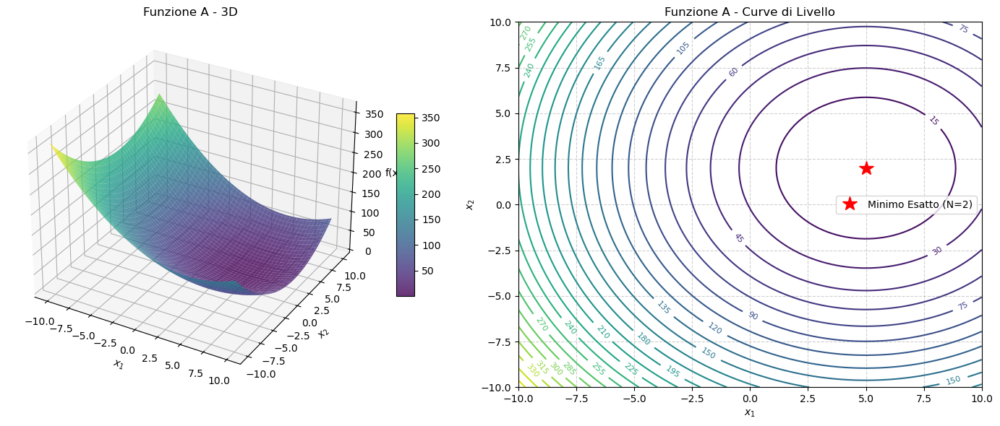

Punto iniziale [0. 0.]
GD: Soluzione trovata: [4.99996346 1.99998538], Errore assoluto finale: 7.308e-06
senza backtracking, passo fisso alpha=0.1


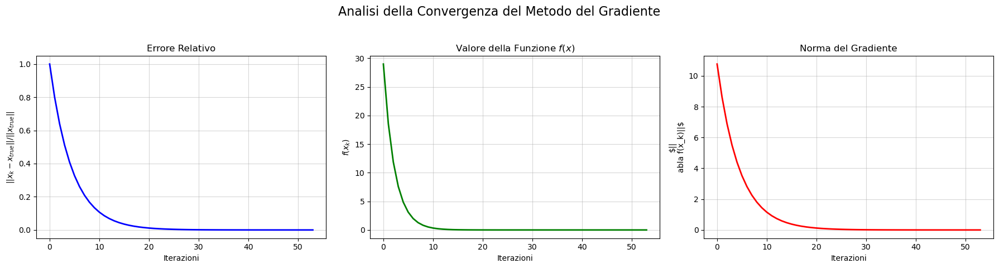

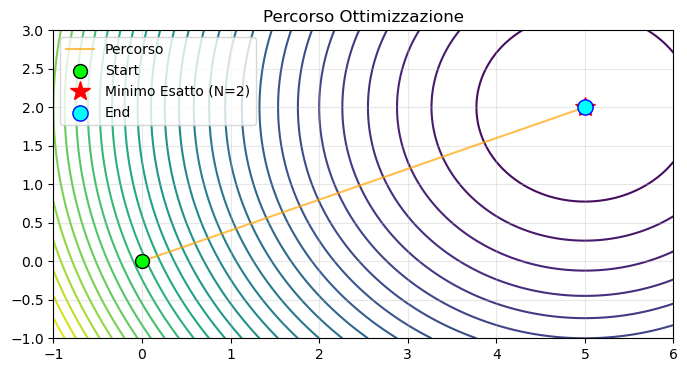

GD: Soluzione trovata: [5. 2.], Errore assoluto finale: 0.000e+00
con backtracking


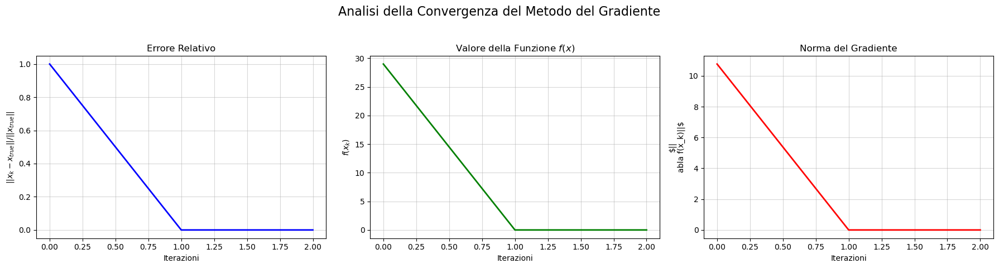

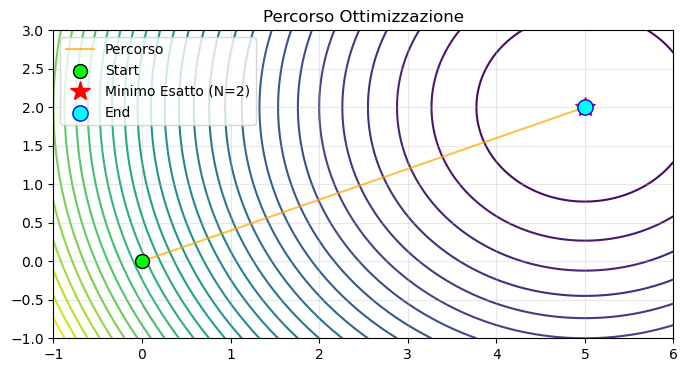

SGD: Soluzione trovata: [4.98964975 1.99501264], Errore assoluto finale: 2.133e-03
con passo fisso alpha=0.001 e batch size=1, quindi 3041.0 epoche


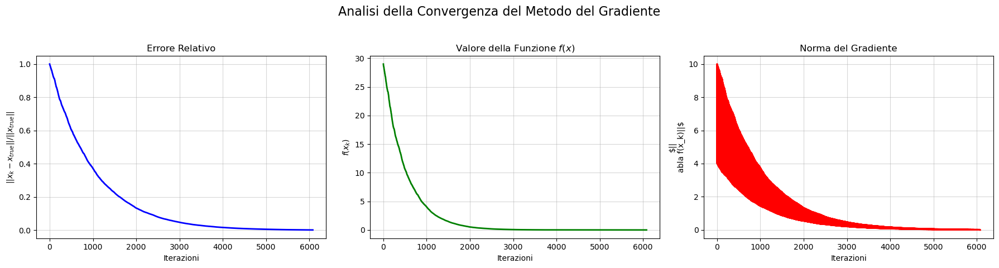

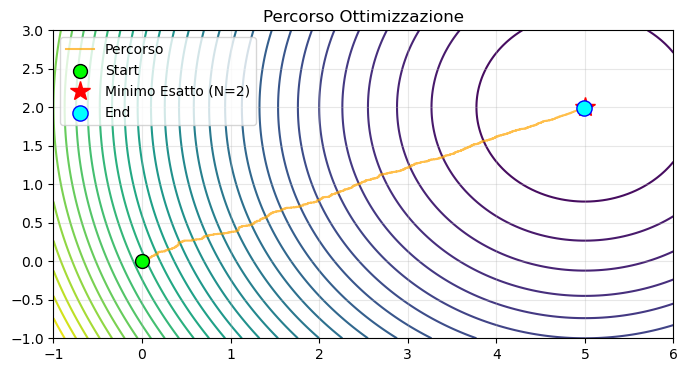

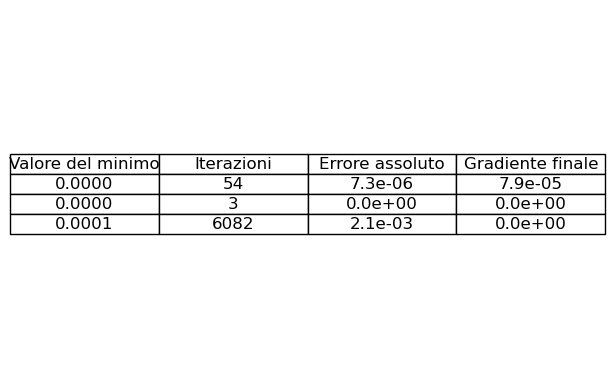

GD: Soluzione trovata: [4.99954899 1.99981959], Errore assoluto finale: 9.020e-05
senza backtracking, passo fisso alpha=0.01, iterazioni totali=462


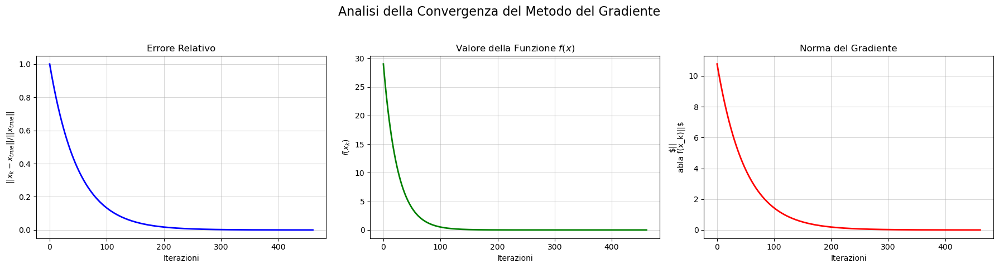

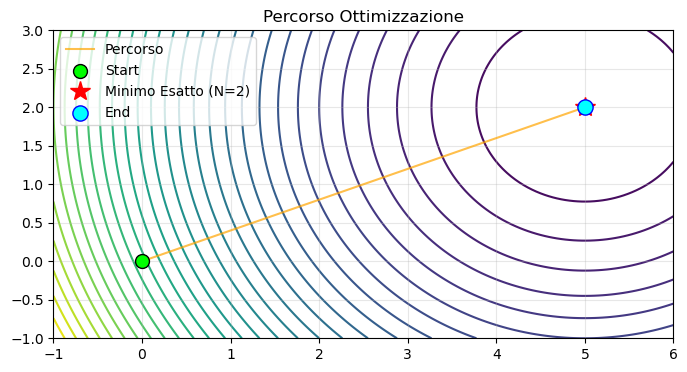

GD: Soluzione trovata: [10.  4.], Errore assoluto finale: 1.000e+00
senza backtracking, passo fisso alpha=1, iterazioni totali=8001


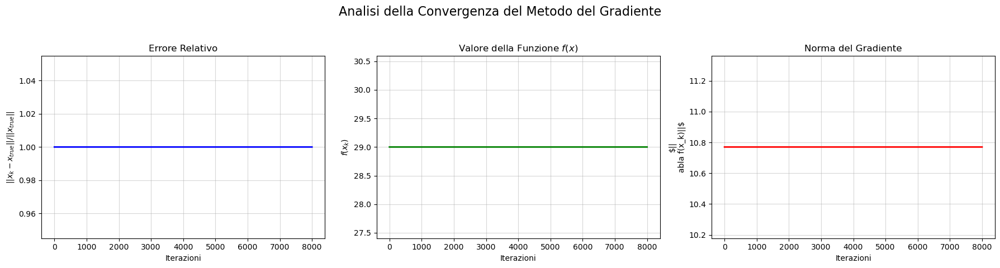

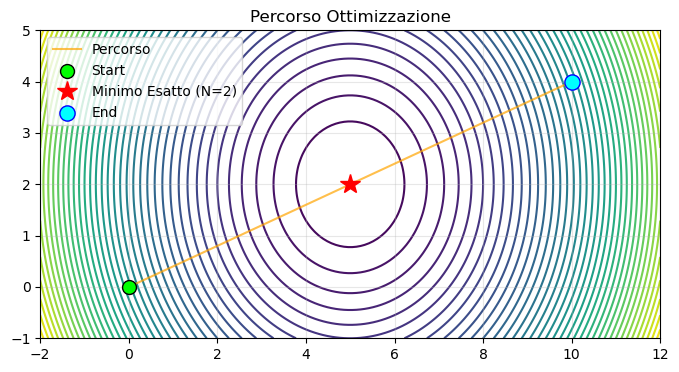

[Funzione di Rosenbrock] Plotting consentito: Dimensione input N=2
Plotting 'Funzione di Rosenbrock' usando modalità: Vettoriale (unico argomento)


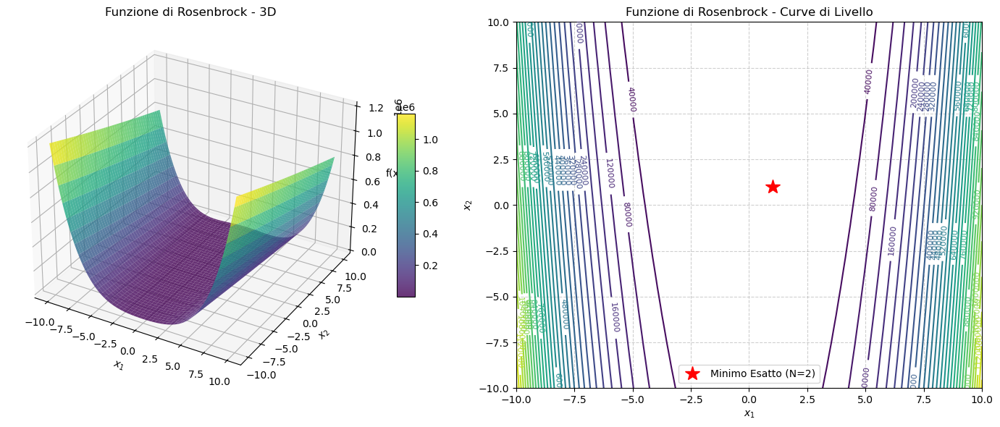

Punto iniziale [0. 0.]
GD: Soluzione trovata: [nan nan], Errore assoluto finale: nan
senza backtracking, passo fisso alpha=0.01


C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:5: RuntimeWarning: overflow encountered in scalar power
  dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:6: RuntimeWarning: overflow encountered in scalar power
  dfdx2 = 200 * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:2: RuntimeWarning: overflow encountered in scalar power
  return (1 - x[0])**2 + 100*(x[1] - x[0]**2)**2
C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:5: RuntimeWarning: invalid value encountered in scalar subtract
  dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:6: RuntimeWarning: invalid value encountered in scalar subtract
  dfdx2 = 200 * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_17764\2300242359.py:2: RuntimeWarning: invalid value encountered in scalar subtract
  return (1 - x[0])**2 + 

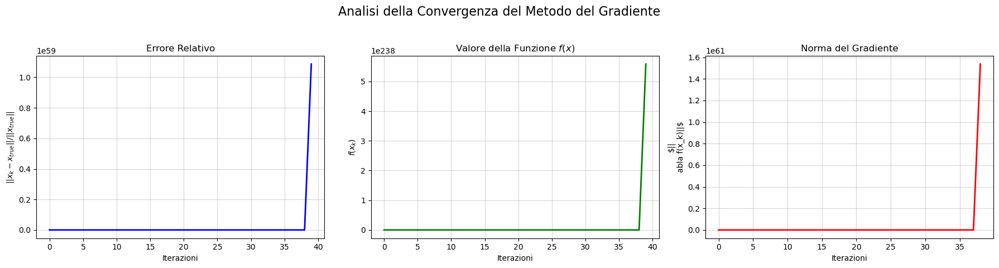

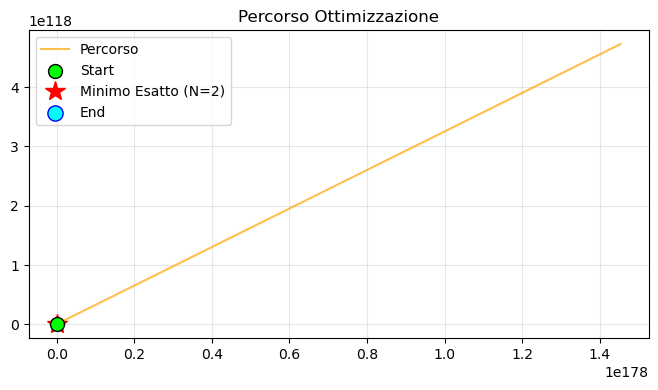

GD: Soluzione trovata: [0.99609721 0.99220165], Errore assoluto finale: 6.166e-03
con backtracking


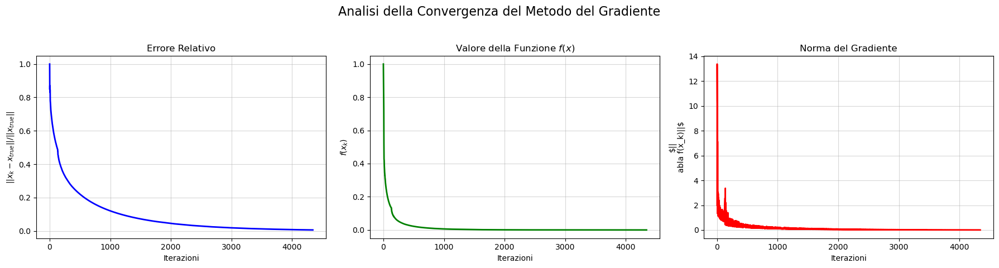

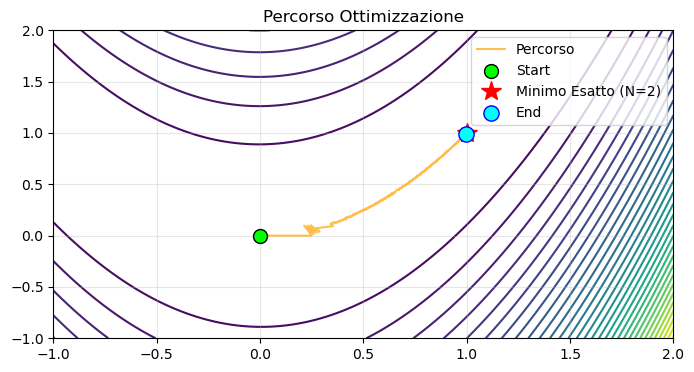

SGD: Soluzione trovata: [0. 0.], Errore assoluto finale: 1.000e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1.0 epoche


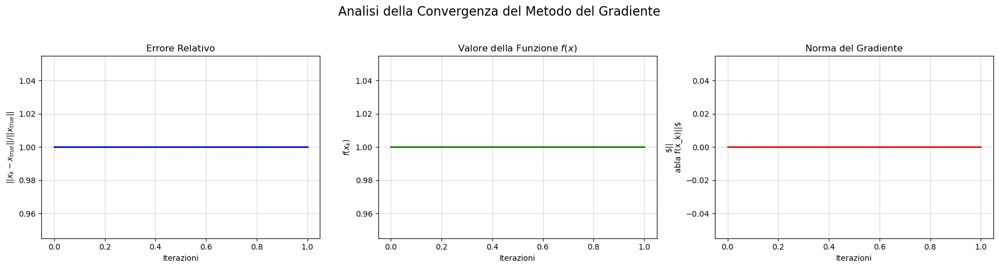

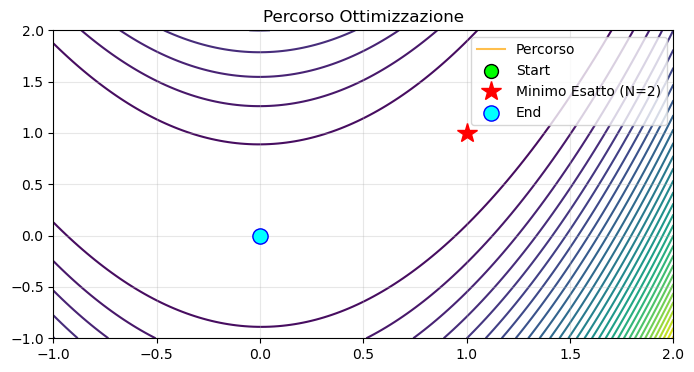

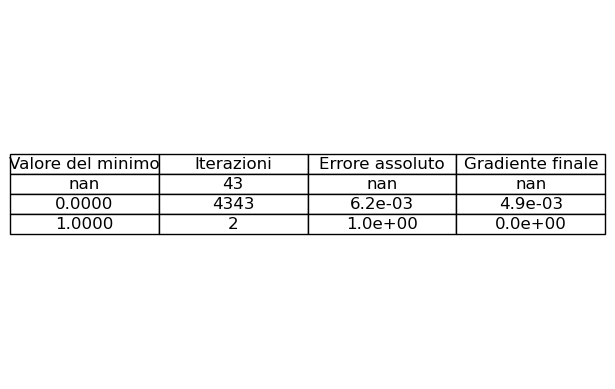

GD: Soluzione trovata: [0.46330448 0.2853615 ], Errore assoluto finale: 6.457e-01
senza backtracking, passo fisso alpha=0.005, iterazioni totali=8001


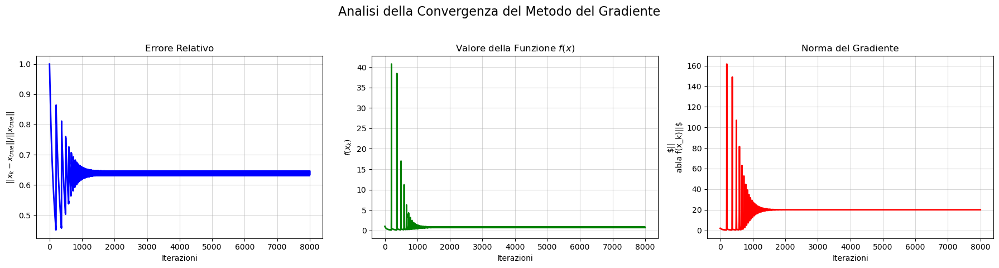

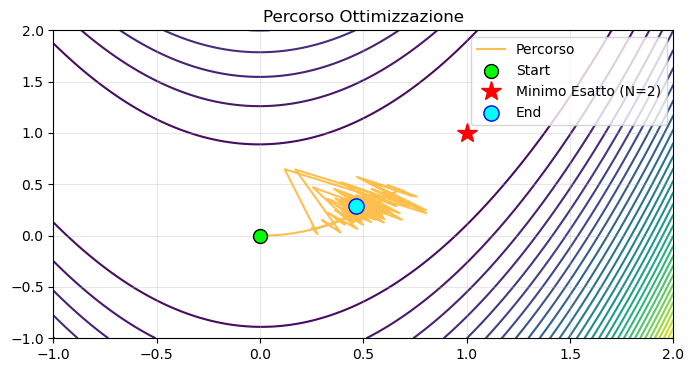

GD: Soluzione trovata: [0.98741906 0.97494568], Errore assoluto finale: 1.983e-02
senza backtracking, passo fisso alpha=0.001, iterazioni totali=8001


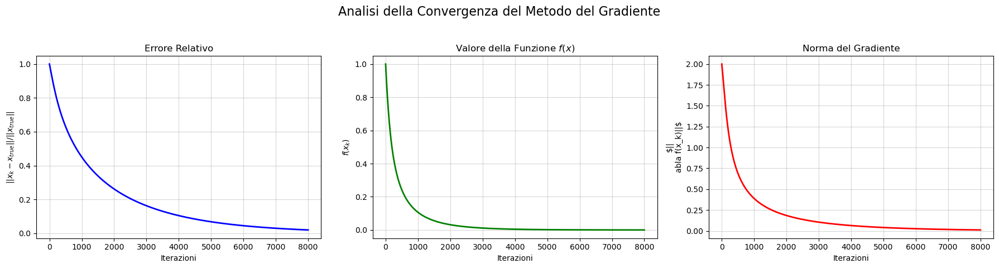

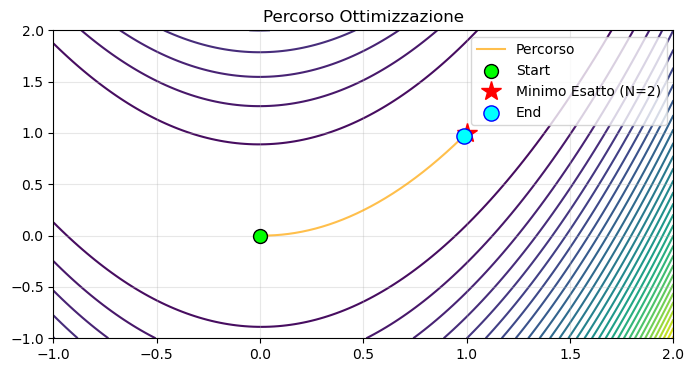

GD: Soluzione trovata: [0.98591073 0.97196312], Errore assoluto finale: 2.220e-02
senza backtracking, passo fisso alpha=0.001, iterazioni totali=8001


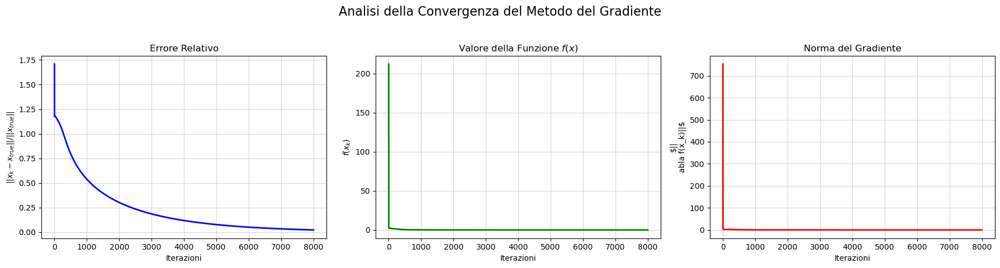

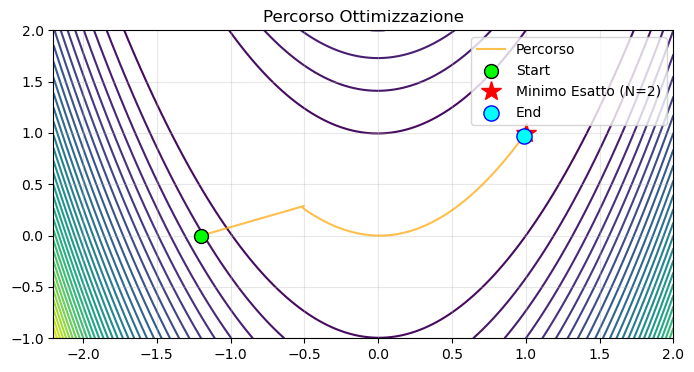

[Funzione multimodale] Plotting consentito: Dimensione input N=2
Plotting 'Funzione multimodale' usando modalità: Vettoriale (unico argomento)


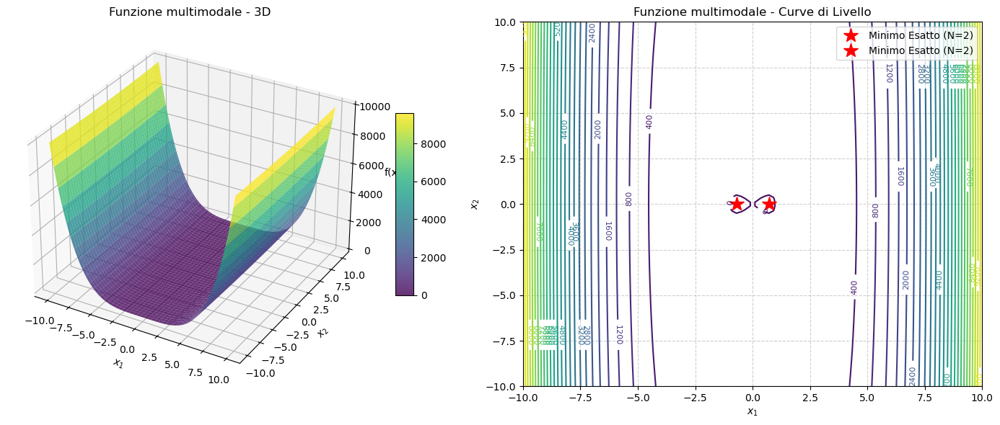

Punto iniziale [0.5 1. ]
GD: Soluzione trovata: [7.07106781e-01 3.48449144e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


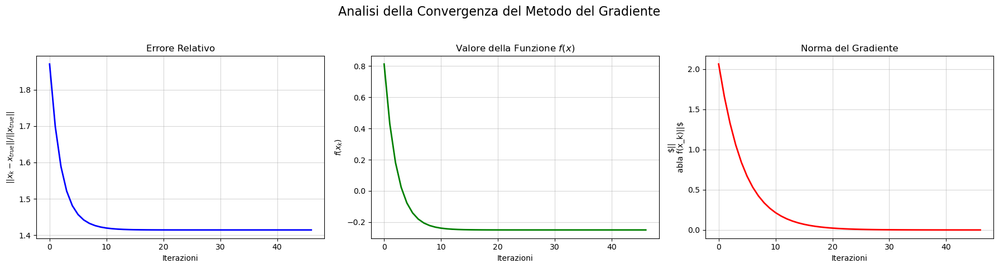

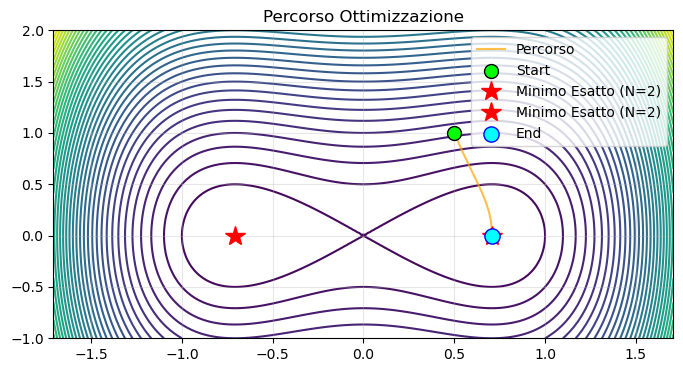

GD: Soluzione trovata: [0.70710678 0.        ], Errore assoluto finale: 1.414e+00
con backtracking


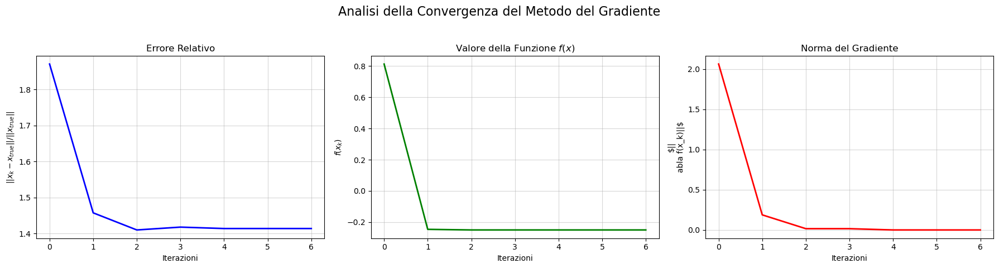

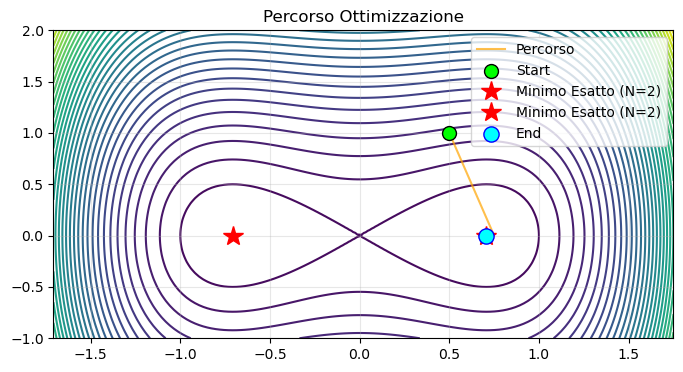

SGD: Soluzione trovata: [0.70461029 0.09903192], Errore assoluto finale: 1.419e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1195.5 epoche


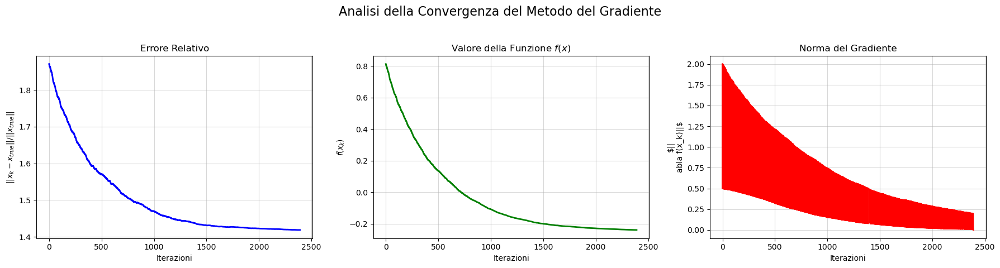

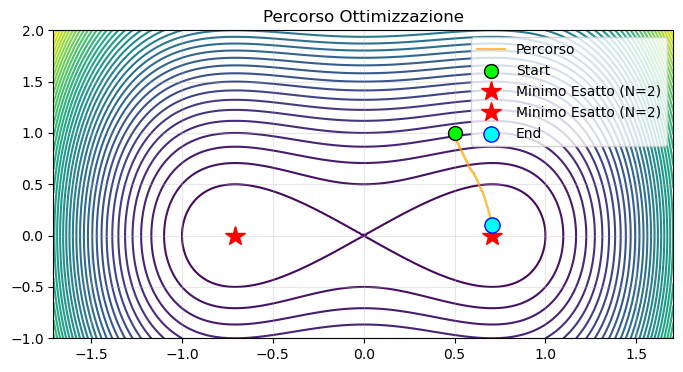

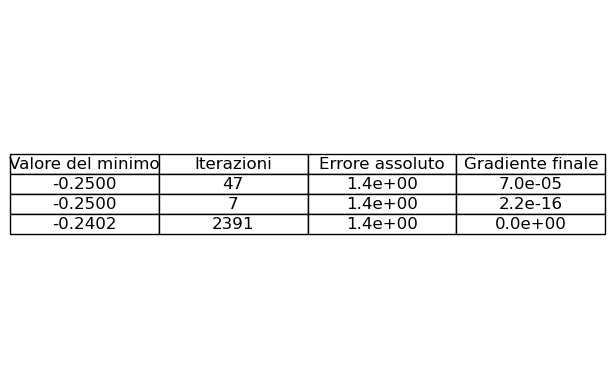

Punto iniziale [-0.5 -1. ]
GD: Soluzione trovata: [-7.07106781e-01 -3.48449144e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


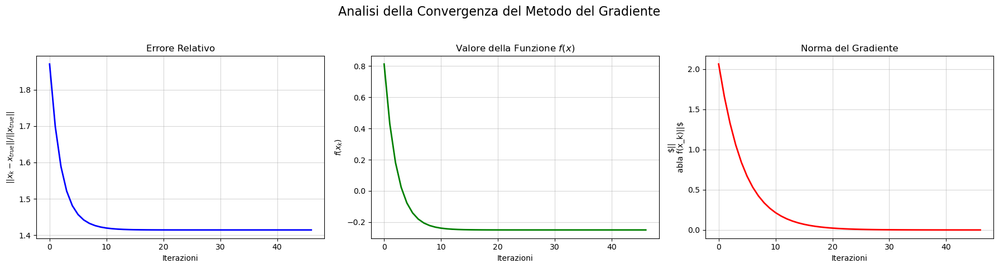

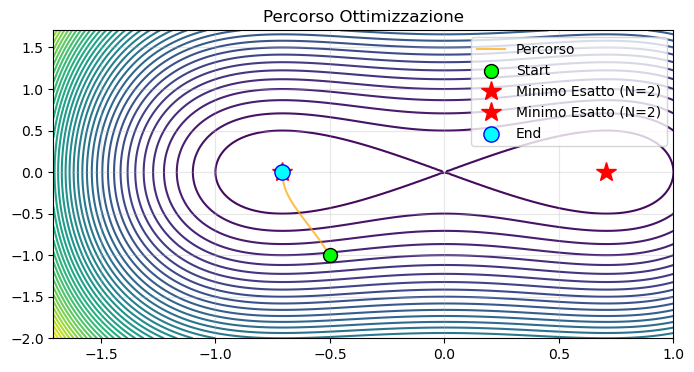

GD: Soluzione trovata: [-0.70710678  0.        ], Errore assoluto finale: 1.414e+00
con backtracking


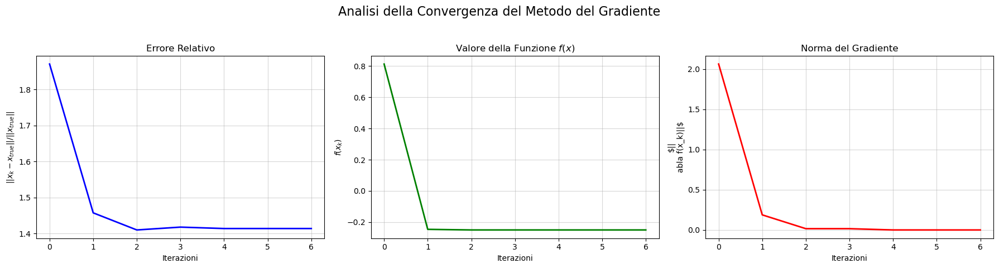

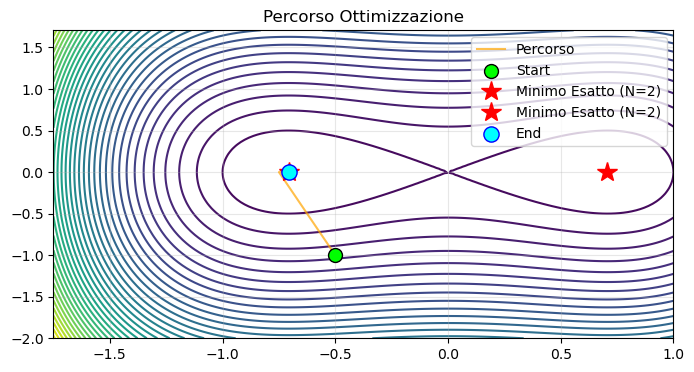

SGD: Soluzione trovata: [-0.70461029 -0.08286924], Errore assoluto finale: 1.417e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1240.0 epoche


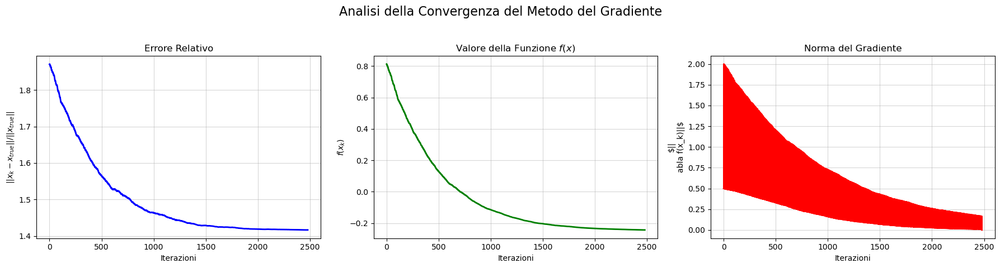

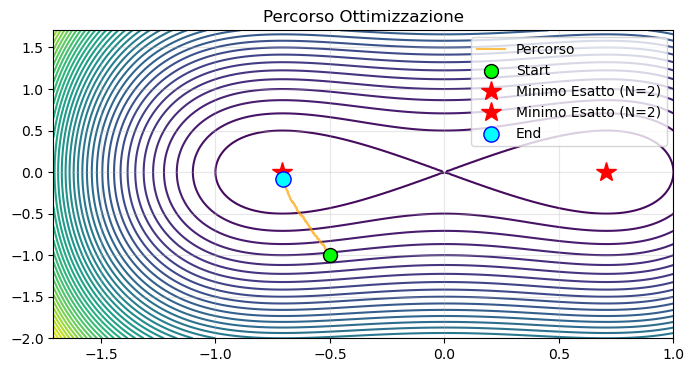

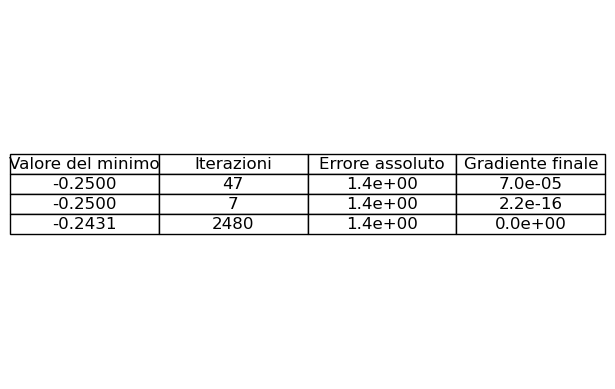

Punto iniziale [0.1 0.2]
GD: Soluzione trovata: [7.07106581e-01 3.32306999e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


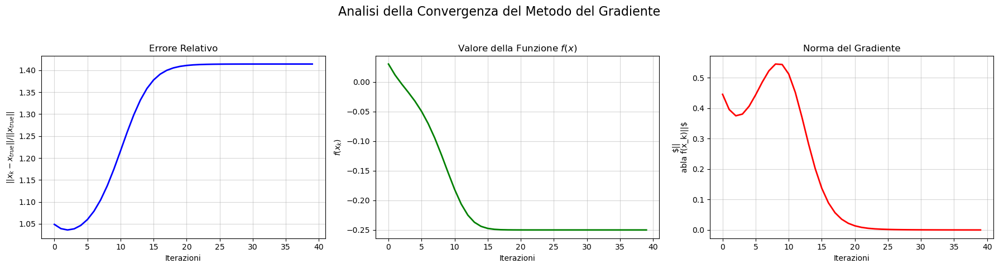

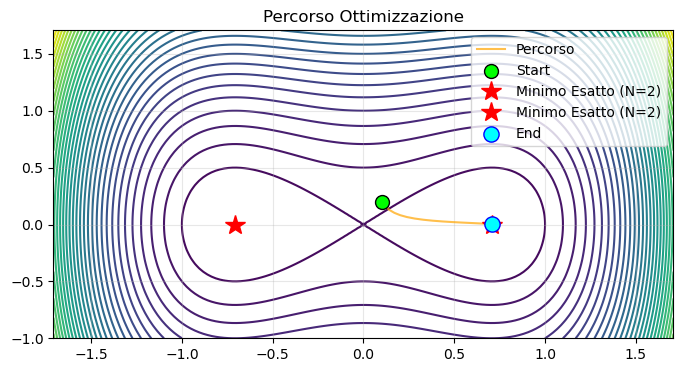

GD: Soluzione trovata: [0.70710678 0.        ], Errore assoluto finale: 1.414e+00
con backtracking


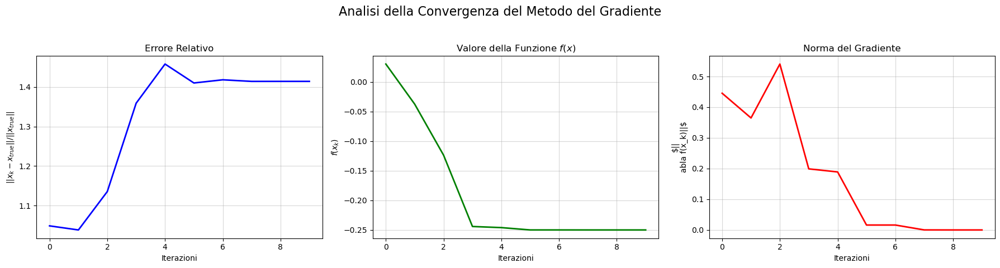

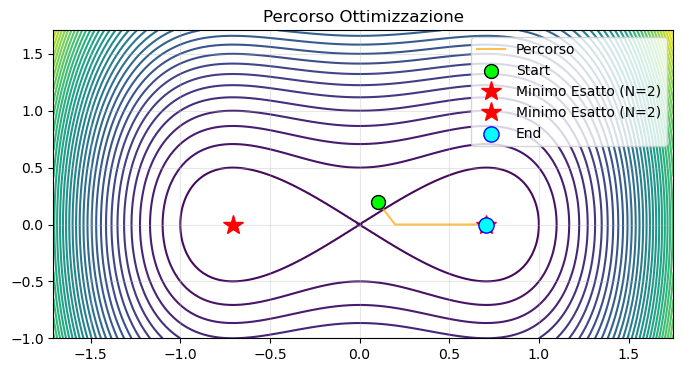

SGD: Soluzione trovata: [0.6969421  0.00498595], Errore assoluto finale: 1.404e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1849.5 epoche


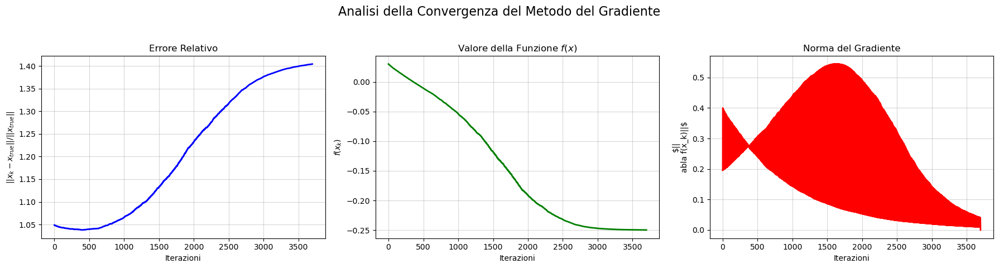

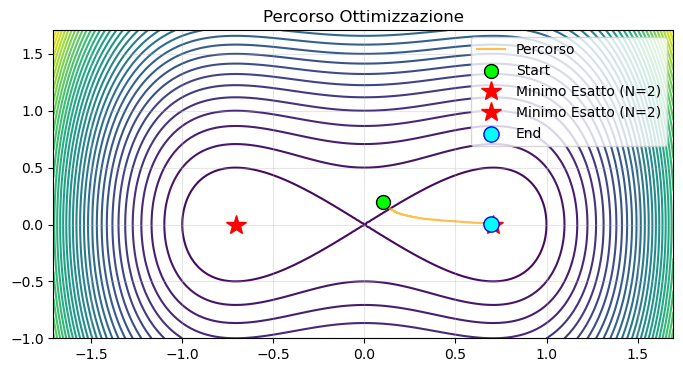

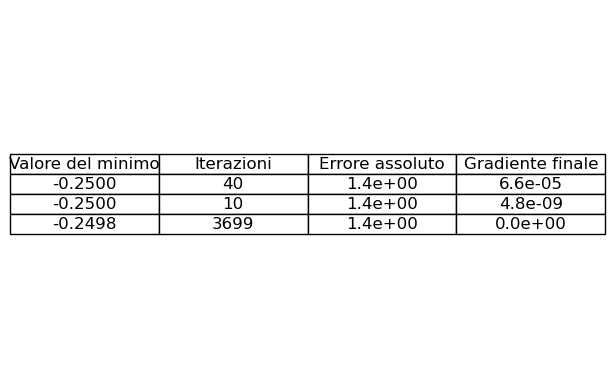

Matrice A:
[[0.3503818  0.80552633]
 [0.09375649 0.44818818]]
Vettore b: [1.15590813 0.54194467]
Parametro di regolarizzazione lambda: 0.8888144225734345
[Funzione minimi quadrati lineari] Plotting consentito: Dimensione input N=2
Plotting 'Funzione minimi quadrati lineari' usando modalità: Vettoriale (unico argomento)


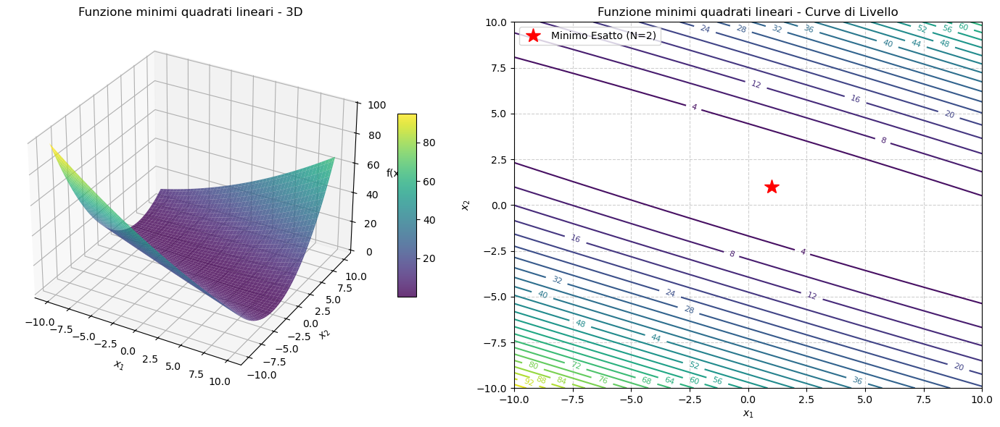

Punto iniziale [0. 0.]
GD: Soluzione trovata: [0.98632965 1.0052588 ], Errore assoluto finale: 1.036e-02
senza backtracking, passo fisso alpha=0.1


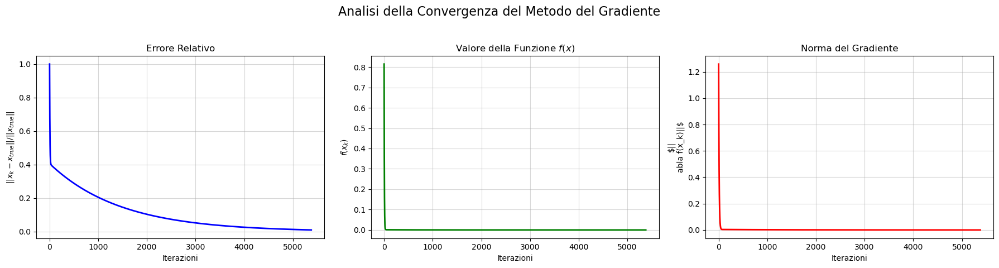

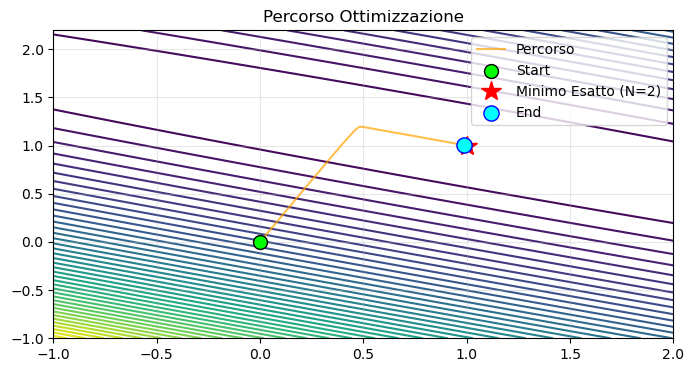

GD: Soluzione trovata: [0.99727888 1.00104678], Errore assoluto finale: 2.062e-03
con backtracking


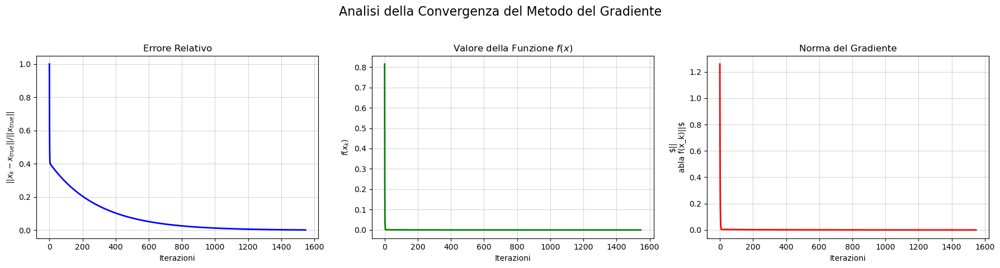

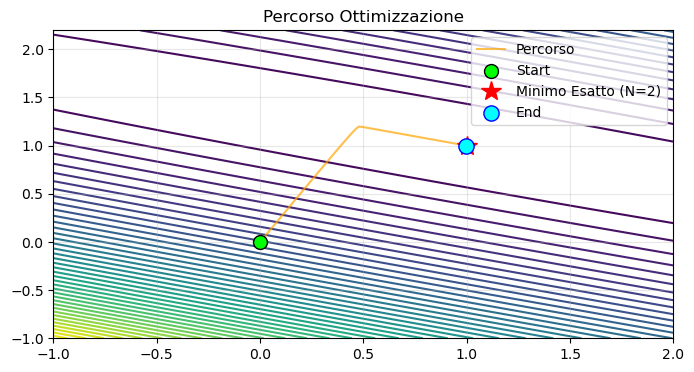

SGD: Soluzione trovata: [0.42369387 1.07248537], Errore assoluto finale: 4.107e-01
con passo fisso alpha=0.001 e batch size=1, quindi 2261.0 epoche


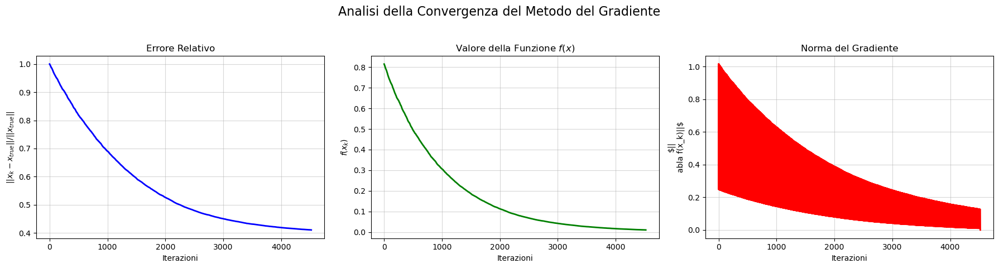

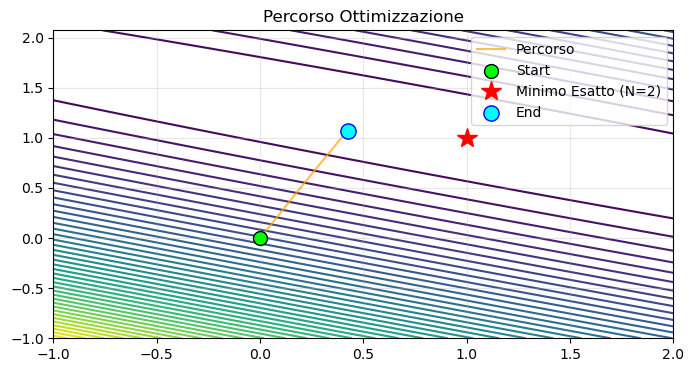

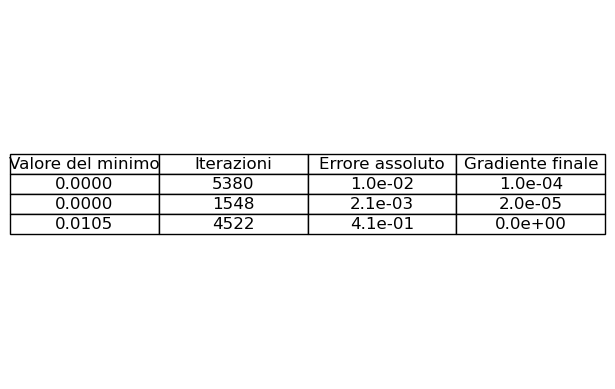

Matrice A:
[[0.88887369 0.11999257 0.66949676 0.71986556 0.48258755]
 [0.62611091 0.49495847 0.53687557 0.47798244 0.56148936]
 [0.68036639 0.18165584 0.84249596 0.09597191 0.97507428]
 [0.75872337 0.27088164 0.39054937 0.33215094 0.81520759]
 [0.56996768 0.4161991  0.45533269 0.73688653 0.68011614]]
Vettore b: [2.88081613 2.69741675 2.77556438 2.56751291 2.85850214]
Parametro di regolarizzazione lambda: 0.6835138759362757
Soluzione esatta: [1. 1. 1. 1. 1.]
Punto iniziale [0.04951594 0.93457096 0.93388474 0.68428781 0.25422072]
GD: Soluzione trovata: [0.98467063 0.99660014 1.01049337 1.00717768 1.00326964], Errore assoluto finale: 9.153e-03
senza backtracking, passo fisso alpha=0.01


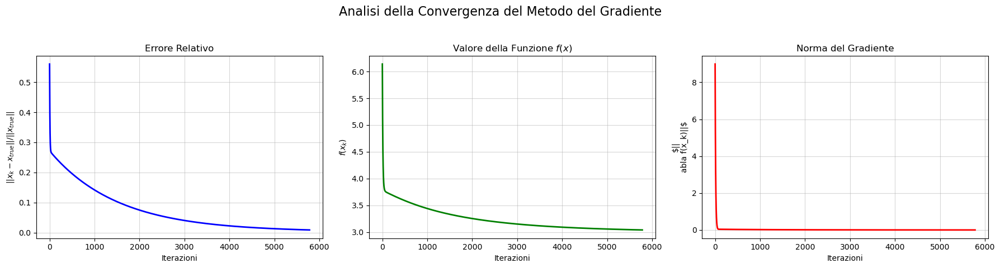

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [2.53777204 1.94109462 2.97491815 2.32240094 2.73349312], Errore assoluto finale: 1.543e+00
con backtracking


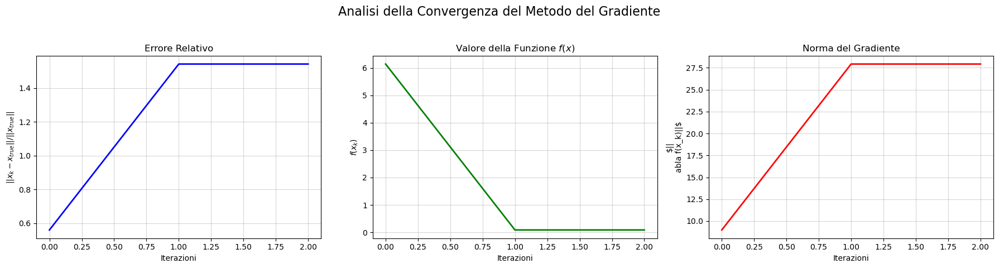

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [0.6358386  1.16674363 1.4043571  1.061312   0.83895242], Errore assoluto finale: 2.659e-01
con passo fisso alpha=0.001 e batch size=2, quindi 786.4 epoche


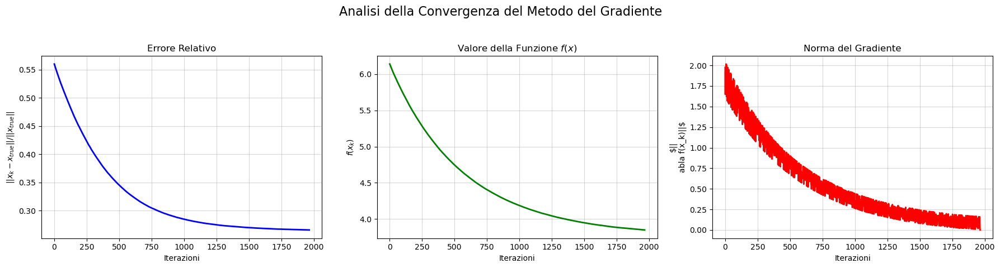

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


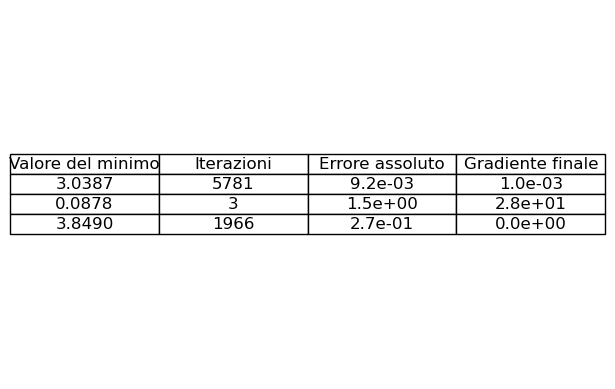

Matrice A:
[[0.95957522 0.05885398]
 [0.27214148 0.57689429]]
Vettore b: [1.0184292  0.84903577]
Parametro di regolarizzazione lambda: 0.04313987206004988
[Funzione minimi quadrati con regolarizzazione] Plotting consentito: Dimensione input N=2
Plotting 'Funzione minimi quadrati con regolarizzazione' usando modalità: Vettoriale (unico argomento)


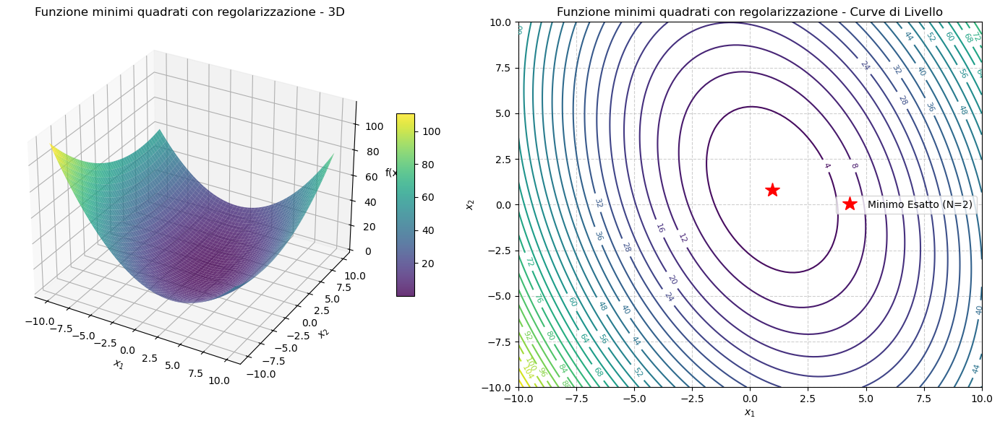

Punto iniziale [0. 0.]
GD: Soluzione trovata: [0.95621113 0.81771967], Errore assoluto finale: 2.089e-04
senza backtracking, passo fisso alpha=0.1


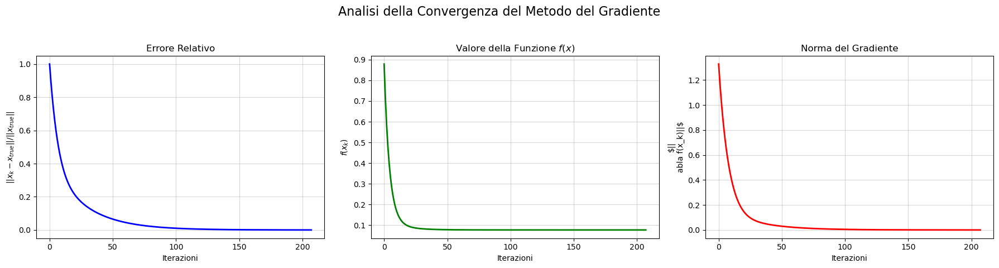

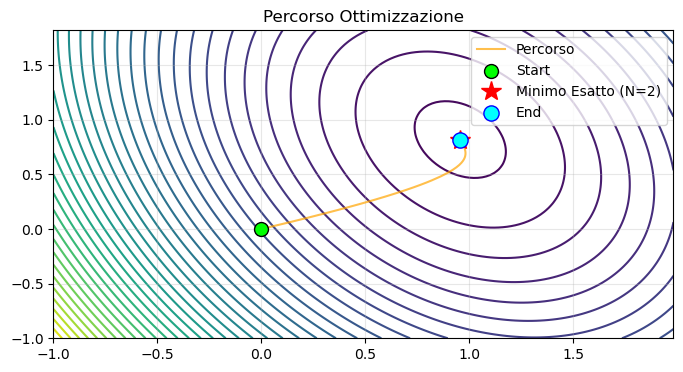

GD: Soluzione trovata: [0.95614738 0.81793521], Errore assoluto finale: 3.027e-05
con backtracking


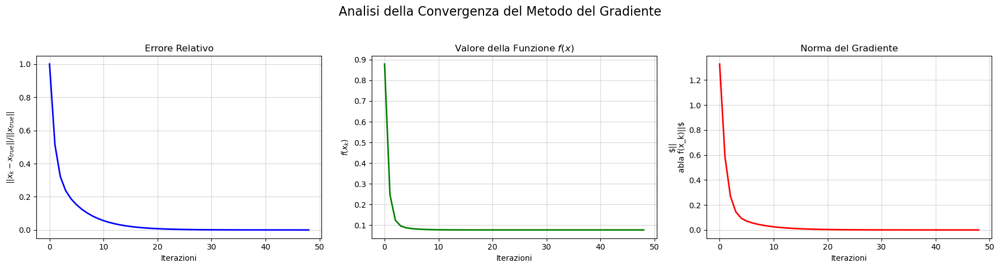

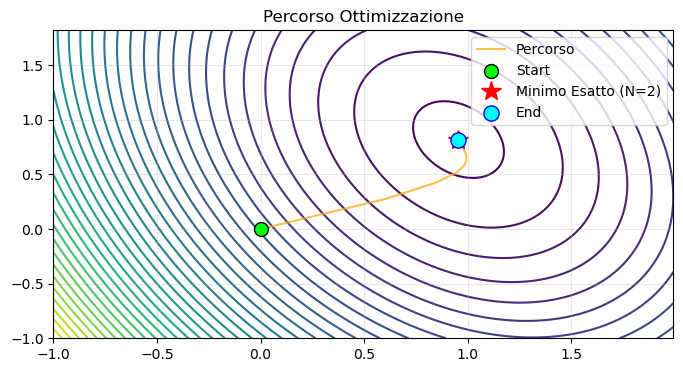

SGD: Soluzione trovata: [0.90924392 0.69293648], Errore assoluto finale: 1.061e-01
con passo fisso alpha=0.001 e batch size=1, quindi 10000.5 epoche


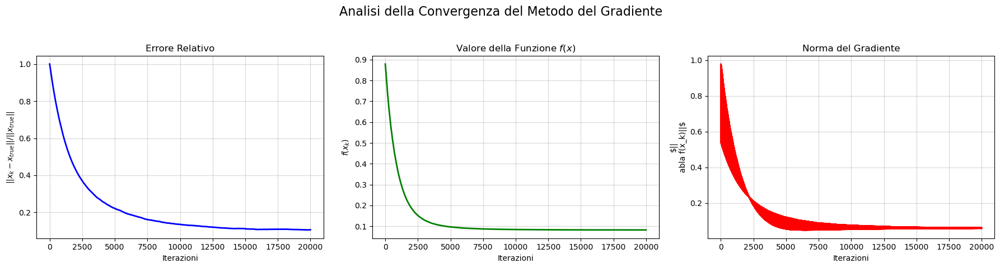

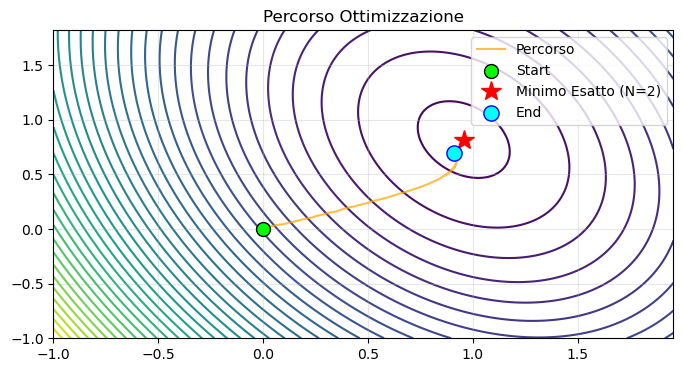

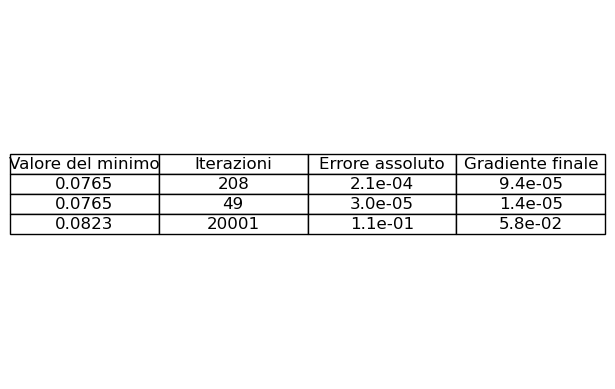

Matrice A:
[[0.3385229  0.65065817 0.24017171 0.86477321 0.04543077]
 [0.00207808 0.79455277 0.46859492 0.5386169  0.02494305]
 [0.37312896 0.29619497 0.61527664 0.77557246 0.13101028]
 [0.14032631 0.32034574 0.76233389 0.33839423 0.89829922]
 [0.09687285 0.91666735 0.84534144 0.88393815 0.0748341 ]]
Vettore b: [2.13955676 1.82878572 2.19118331 2.45969938 2.8176539 ]
Parametro di regolarizzazione lambda: 0.1443034308404808
Soluzione esatta: [1. 1. 1. 1. 1.]
Punto iniziale [0.16325515 0.65210971 0.0772951  0.58408472 0.36908195]
GD: Soluzione trovata: [0.60916708 0.83878241 0.90602313 1.30066641 1.08613946], Errore assoluto finale: 2.389e-01
senza backtracking, passo fisso alpha=0.01


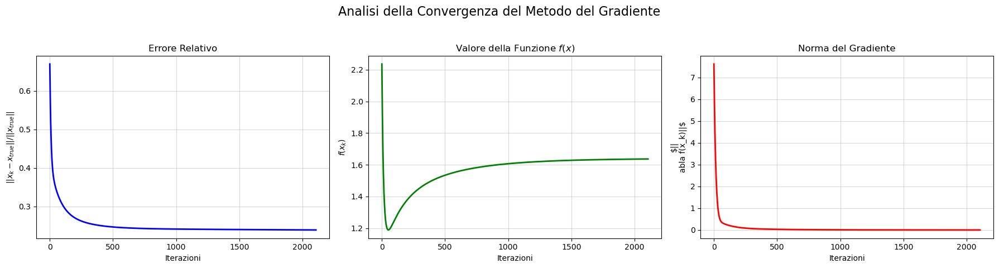

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [0.78434043 2.52028001 2.09215148 2.76383316 1.27105683], Errore assoluto finale: 1.161e+00
con backtracking


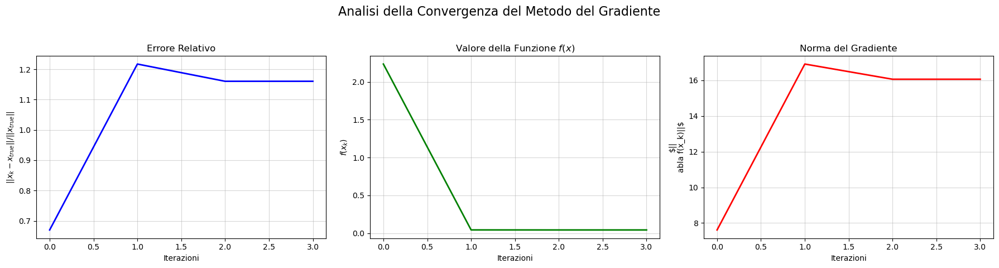

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [0.35536626 1.1493026  0.67527204 1.19550012 0.68835825], Errore assoluto finale: 3.684e-01
con passo fisso alpha=0.001 e batch size=2, quindi 681.2 epoche


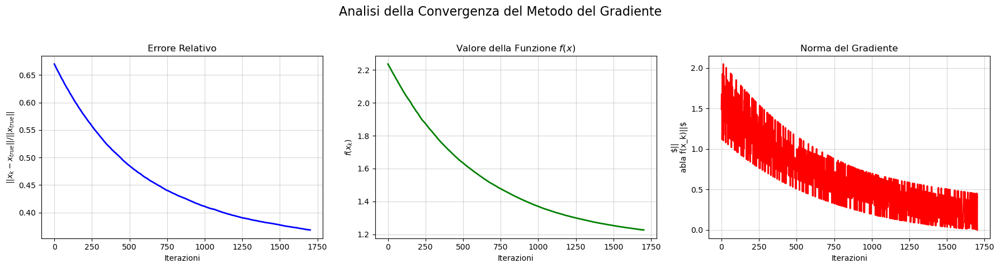

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


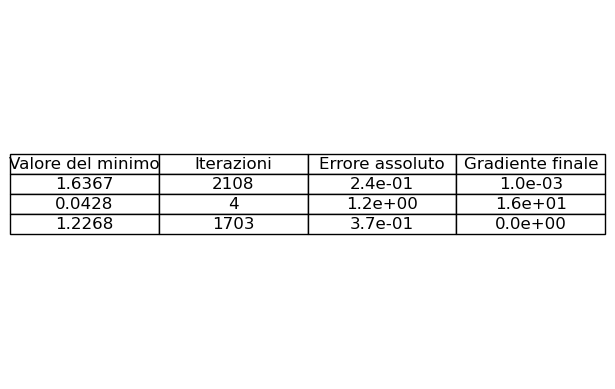

[Funzione F] Plotting consentito: Dimensione input N=2
Plotting 'Funzione F' usando modalità: Vettoriale (unico argomento)


C:\Users\alext\AppData\Local\Temp\ipykernel_17764\1231046485.py:15: RuntimeWarning: invalid value encountered in log
  term_ln = np.sum(np.log(x), axis=0)


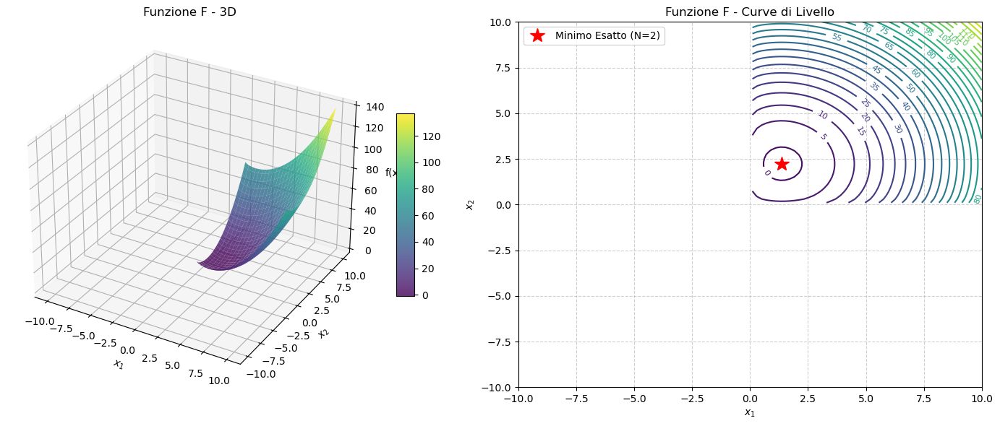

Punto iniziale [1. 1.]
GD: Soluzione trovata: [1.36602385 2.22471255], Errore assoluto finale: 1.239e-05
senza backtracking, passo fisso alpha=0.1


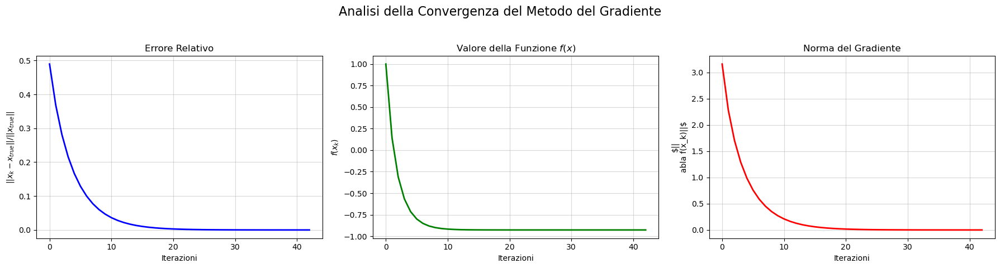

C:\Users\alext\AppData\Local\Temp\ipykernel_17764\1231046485.py:15: RuntimeWarning: divide by zero encountered in log
  term_ln = np.sum(np.log(x), axis=0)


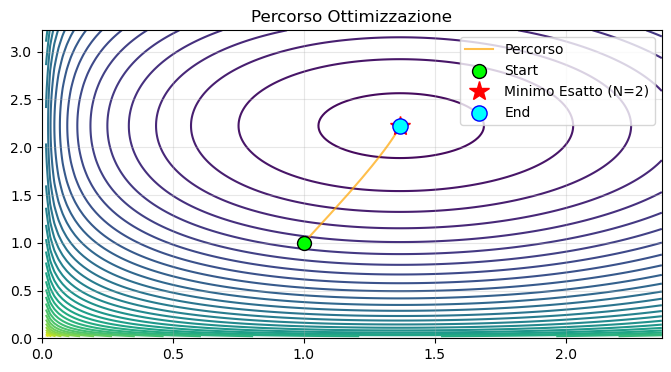

GD: Soluzione trovata: [1.36602452 2.22474487], Errore assoluto finale: 3.391e-07
con backtracking


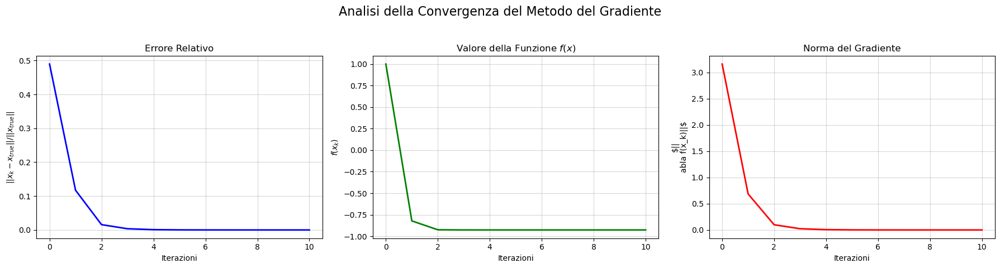

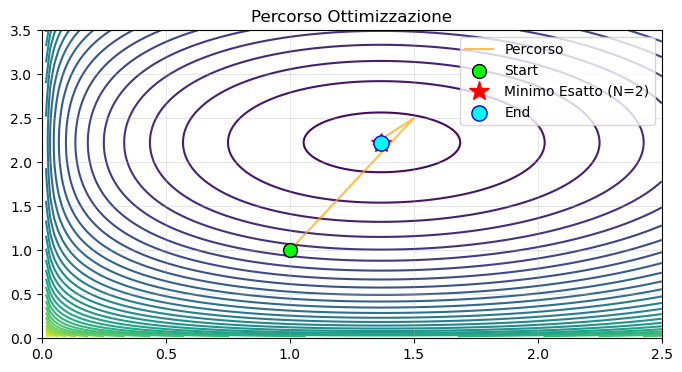

SGD: Soluzione trovata: [1.36544518 2.22027025], Errore assoluto finale: 1.728e-03
con passo fisso alpha=0.001 e batch size=1, quindi 1257.5 epoche


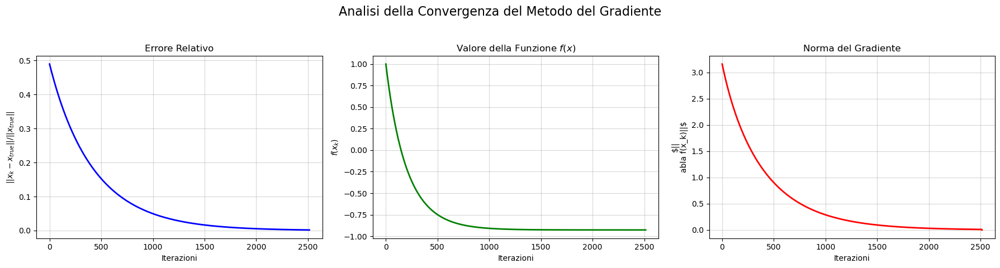

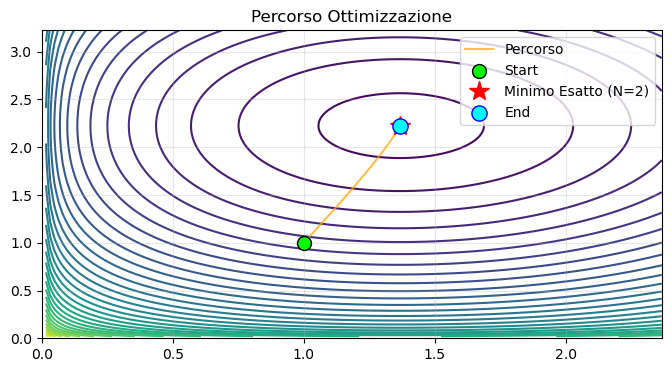

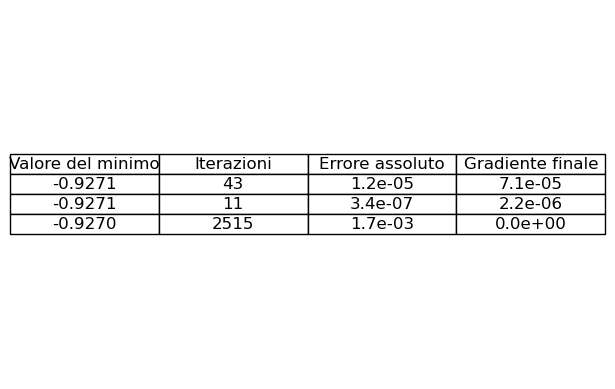

Punto iniziale [4.48054635 6.69859682 3.93392462 8.14992929 9.98602905 5.75092049
 8.09678975 1.02411569 8.2935382  2.52339057 4.79675341 4.2996558
 1.42627221 6.87407971 2.3271038  8.66665357 6.04209773 6.23817673
 2.16100287 3.24167304 6.79818493 5.84992131 6.64527352 1.16366006
 7.30146798 4.25396944 4.74601679 5.25595941 6.31205341 4.87874542
 7.69760829 1.77068116 5.63637976 4.85854648 3.71747975 2.64728611
 4.12185955 9.96953747 9.35766405 2.92117162 8.59176238 4.16302827
 1.47122836 1.48012463 1.3871771  5.31415114 4.11021144 9.17221574
 4.40665035 9.26342433 3.30313909 5.27032194 5.67937676 7.1586149
 8.96393298 5.56424806 7.54414731 5.27040086 5.16797109 6.62007173
 7.54238853 3.56507332 5.53444184 2.06670491 2.95813996 9.02931133
 2.57338679 8.60787007 8.93380123 4.15528906 7.38545737 2.42881844
 9.59783959 6.49088582 8.72035699 2.07740581 8.93534674 2.17720053
 3.42657315 9.44559524 8.94974082 7.88684592 3.96852553 3.36914168
 7.78929254 6.50561923 9.24504356 7.49249992 7.13

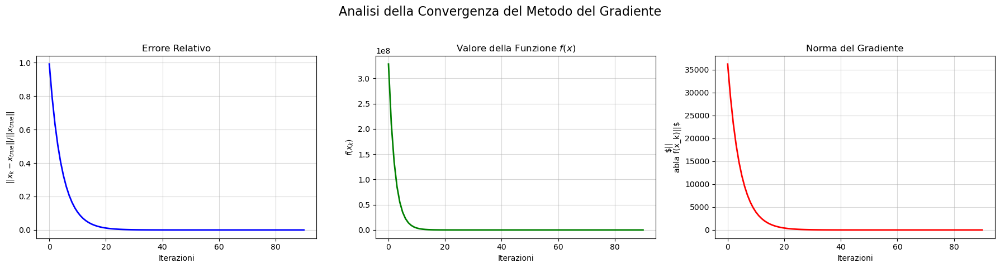

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [   1.36602483    2.22474487    3.1583124     4.12132034    5.09807621
    6.082207      7.07071421    8.0620192     9.05521679   10.04975247
   11.04526825   12.04152299   13.03834842   14.03562364   15.03325959
   16.0311892    17.02936105   18.02773504   19.02627944   20.02496883
   21.02378259   22.02270384   23.02171862   24.02081528   25.01998403
   26.01921657   27.01850583   28.01784577   29.01723114   30.01665742
   31.01612065   32.01561738   33.01514456   34.01469953   35.01427989
   36.01388353   37.01350858   38.01315334   39.0128163    40.0124961
   41.0121915    42.01190139   43.01162476   44.0113607    45.01110837
   46.010867     47.01063589   48.01041441   49.01020196   50.009998
   51.00980204   52.00961361   53.00943228   54.00925767   55.00908941
   56.00892715   57.00877058   58.00861941   59.00847336   60.00833218
   61.008195

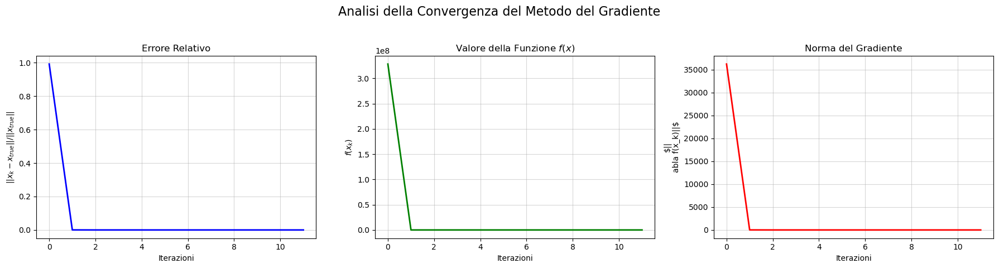

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [   1.36602542    2.22474517    3.1583125     4.12132107    5.09807723
    6.08220693    7.07071446    8.06201751    9.0552166    10.04975056
   11.04526664   12.04152097   13.03834538   14.03562175   15.03325622
   16.03118724   17.02935812   18.02773188   19.02627492   20.02496431
   21.02377875   22.02269947   23.02171419   24.0208091    25.01997922
   26.01921066   27.01849978   28.01783958   29.01722496   30.01665057
   31.0161143    32.01560914   33.0151371    34.01469157   35.01427135
   36.01387443   37.0134996    38.01314568   39.0128082    40.01248596
   41.01218263   42.01189104   43.0116134    44.01134907   45.01109643
   46.01085586   47.01062415   48.01040377   49.01018974   50.00998684
   51.00978897   52.0096008    53.00941932   54.00924483   55.00907679
   56.00891332   57.00875702   58.00860495   59.0084586    60.00831754
   61.00

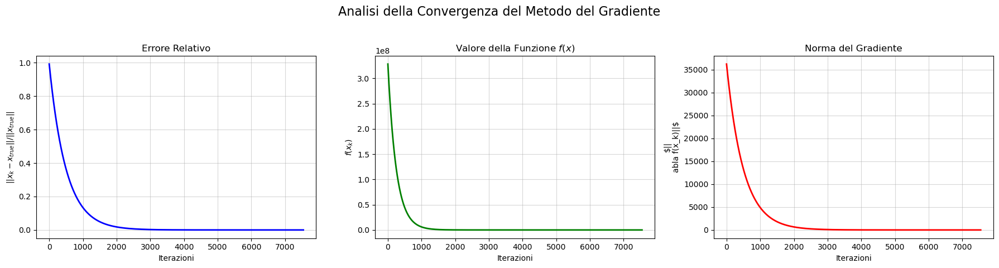

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)


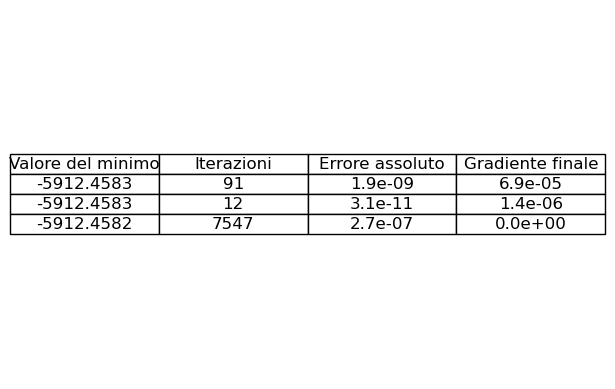

Punto iniziale [8.24562024 8.48743669 3.90649495 ... 4.50769308 5.1233526  9.87748711]
GD: Soluzione trovata: [1.36602540e+00 2.22474487e+00 3.15831240e+00 ... 9.99800005e+03
 9.99900005e+03 1.00000000e+04], Errore assoluto finale: 6.669e-11
senza backtracking, passo fisso alpha=0.1


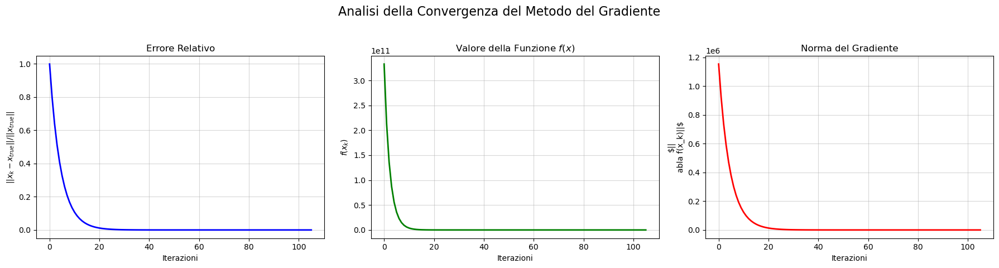

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [1.36602470e+00 2.22474487e+00 3.15831240e+00 ... 9.99800005e+03
 9.99900005e+03 1.00000001e+04], Errore assoluto finale: 1.225e-12
con backtracking


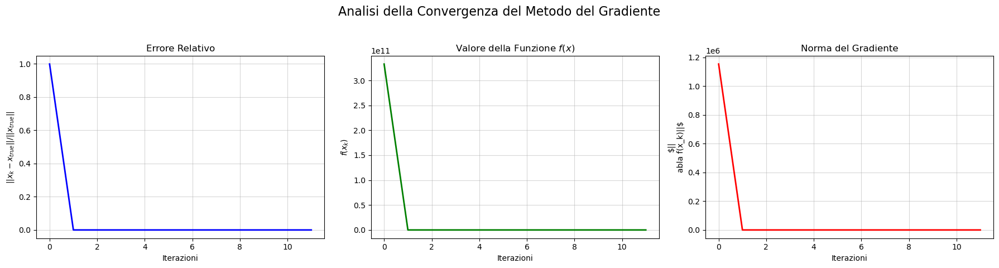

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [1.36602540e+00 2.22474488e+00 3.15831240e+00 ... 9.99799996e+03
 9.99899996e+03 9.99999996e+03], Errore assoluto finale: 8.635e-09
con passo fisso alpha=0.001 e batch size=10, quindi 9.275 epoche


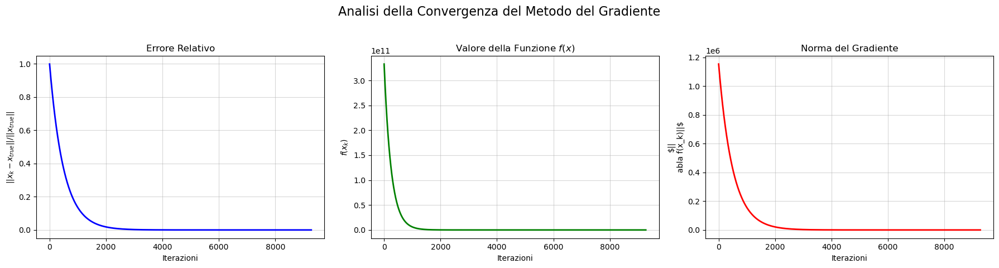

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)


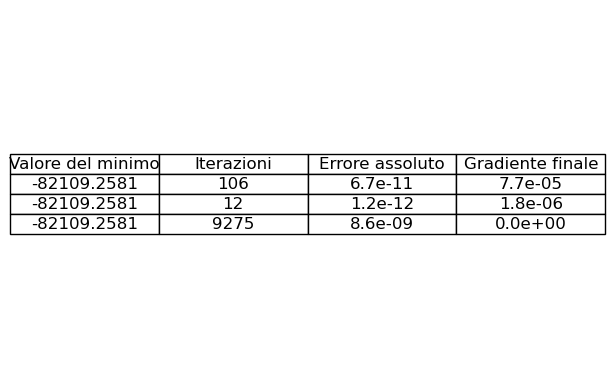

Configurazione:
 N=2
 c=-1.0
 b=[1121.52616494 1994.9765606 ]
[Funzione G] Plotting consentito: Dimensione input N=2
Plotting 'Funzione G' usando modalità: Vettoriale (unico argomento)


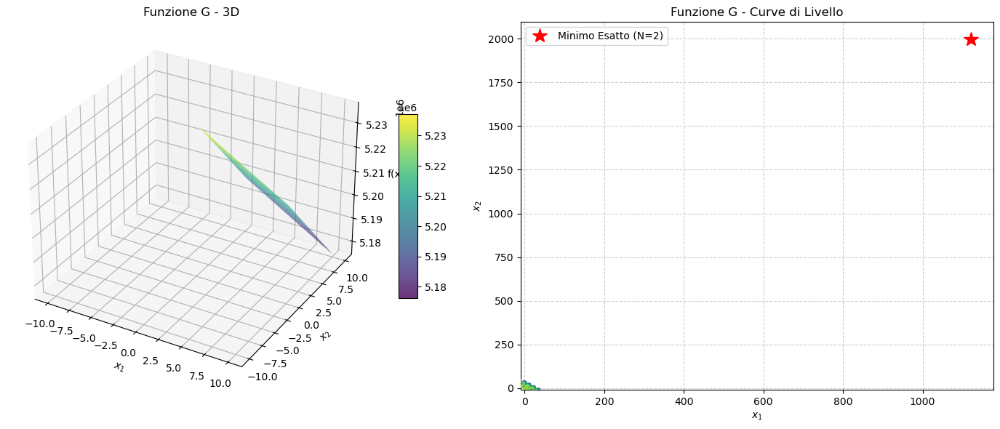

Punto iniziale [1. 1.]
GD: Soluzione trovata: [1121.52659492 1994.97678305], Errore assoluto finale: 1.413e-08
senza backtracking, passo fisso alpha=0.1


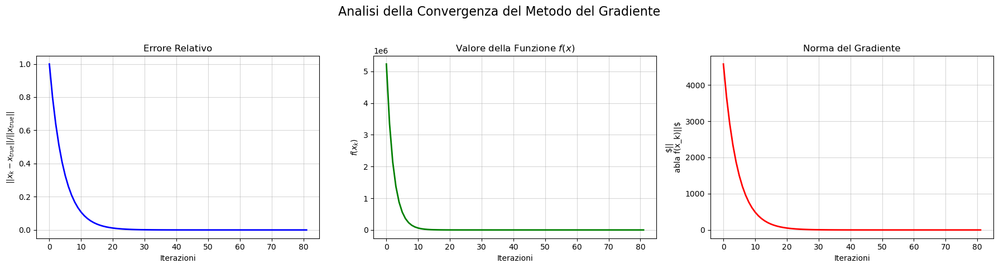

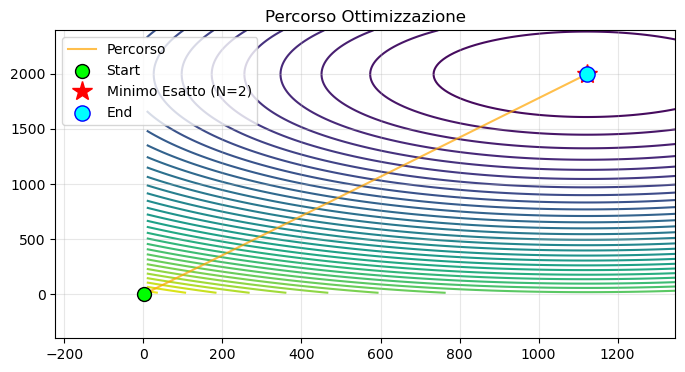

GD: Soluzione trovata: [1121.52661076 1994.97681123], Errore assoluto finale: 9.935e-17
con backtracking


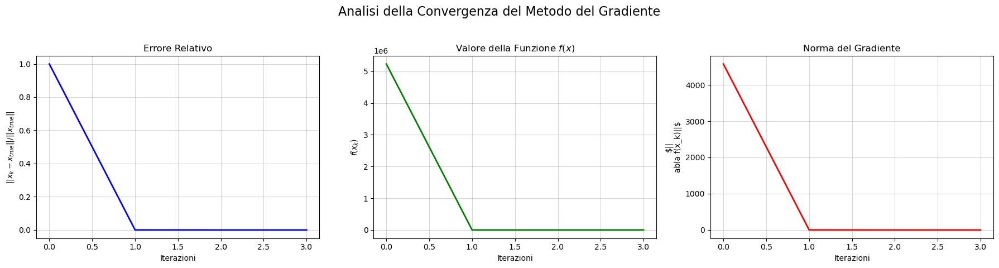

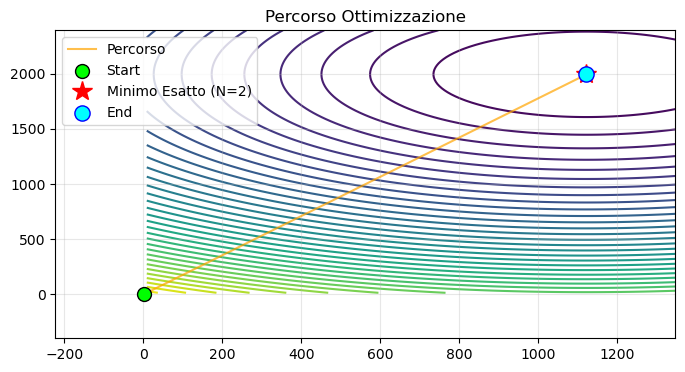

SGD: Soluzione trovata: [1121.52401411 1994.97246492], Errore assoluto finale: 2.212e-06
con passo fisso alpha=0.001 e batch size=1, quindi 3251.0 epoche


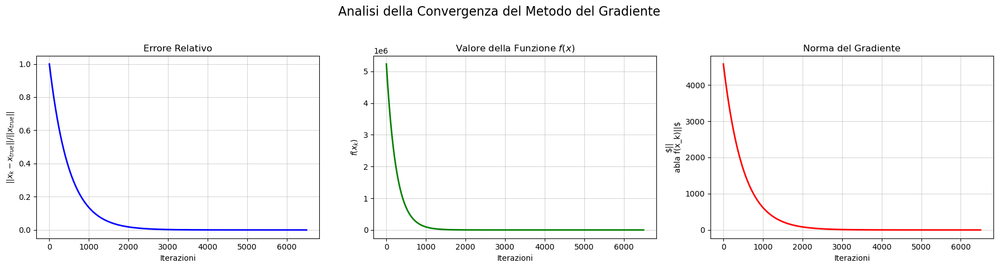

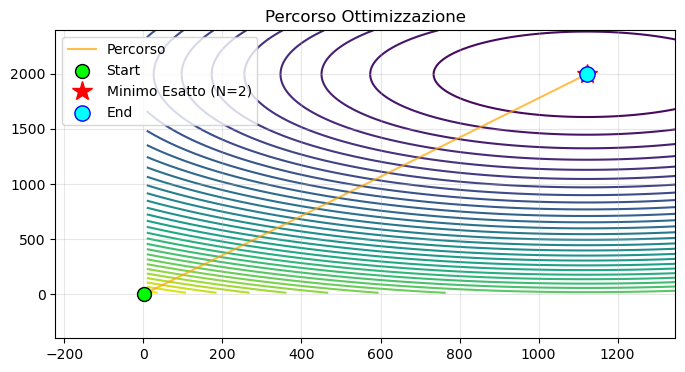

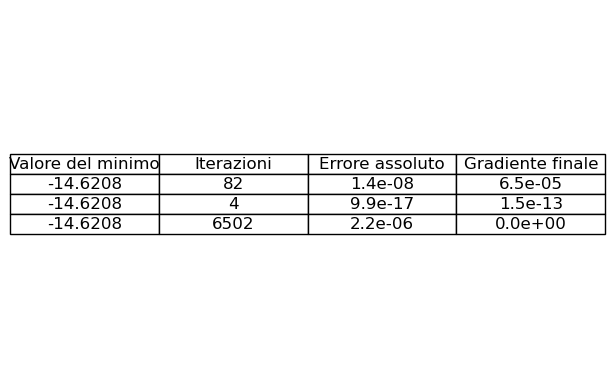

Configurazione:
 N=5
 c=-1.0
 b=[1608.21992177 1351.1247153   244.7717266   656.06443003  339.22514944]
Punto iniziale [0.79468061 0.83786604 0.36881471 0.63942254 0.26759197]
GD: Soluzione trovata: [1608.22020428 1351.1250615   244.77376499  656.06518057  339.2266174 ], Errore assoluto finale: 1.765e-08
senza backtracking, passo fisso alpha=0.1


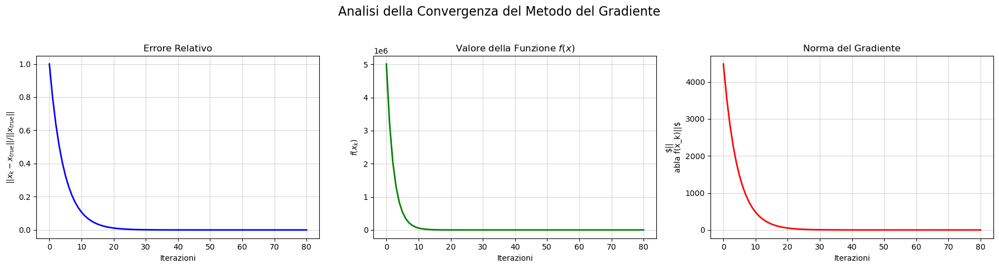

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [1608.22023268 1351.12508536  244.7737693   656.06519215  339.22662338], Errore assoluto finale: 5.675e-17
con backtracking


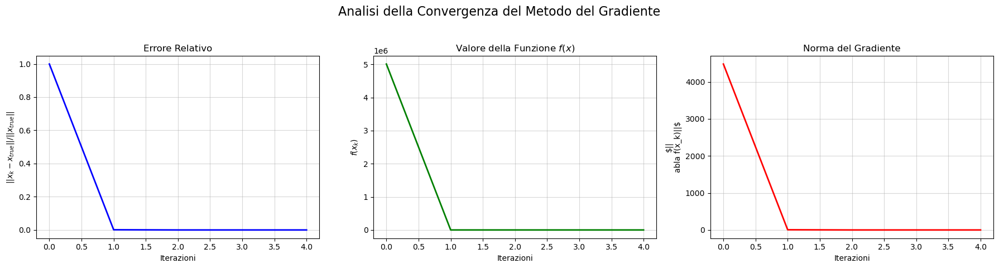

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [1608.21655113 1351.12203992  244.7720414   656.06363347  339.22520857], Errore assoluto finale: 2.455e-06
con passo fisso alpha=0.001 e batch size=2, quindi 2562.0 epoche


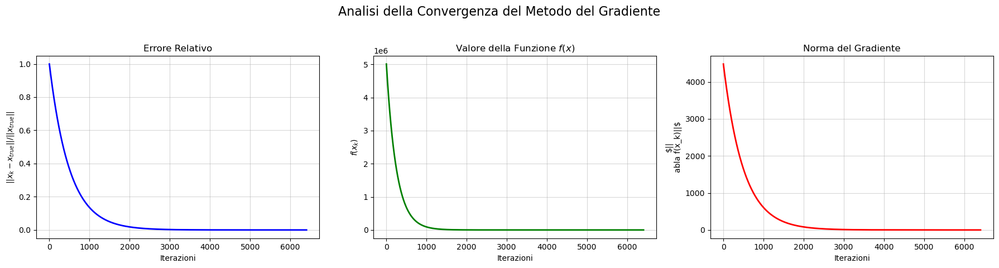

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


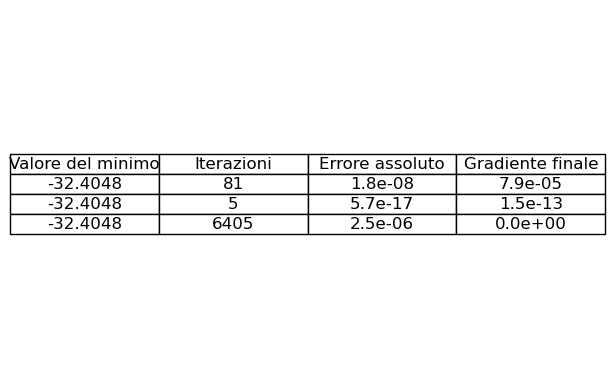

Configurazione:
 N=1000
 c=-1.0
 b=[2.43807247e+02 1.08164869e+03 1.77008174e+03 9.30861128e+01
 4.44230292e+02 1.44639472e+03 1.66746197e+02 5.48602118e+01
 1.90739443e+02 1.57621388e+03 1.14277031e+02 1.53935220e+03
 1.84365532e+03 1.67208047e+03 5.13205076e+02 1.06270254e+03
 8.04882961e+02 1.42567430e+03 1.64267212e+03 4.33538208e+02
 5.61120383e+02 1.62197875e+03 1.18143275e+03 1.59185351e+03
 1.72835998e+03 1.39079381e+03 7.49087363e+02 5.65319660e+02
 1.04691999e+03 1.99215913e+03 3.29427975e+02 7.75971159e+02
 1.29160473e+03 1.99085065e+03 1.63351371e+03 1.82082464e+02
 9.28776215e+02 7.98086085e+02 1.43455870e+03 1.86209065e+03
 1.96017435e+03 2.00570480e+02 1.19542818e+03 1.71799806e+03
 4.98987098e+02 1.55610797e+03 1.30581381e+02 7.00750335e+02
 1.69734474e+02 1.91028378e+02 1.58685226e+03 9.30521825e+02
 5.69148322e+02 1.58947716e+03 5.79018275e+02 1.42965713e+02
 1.58409390e+03 1.51783453e+03 1.71291222e+03 1.05732785e+00
 1.69891538e+03 3.49454289e+02 1.90897806e+03 3.61

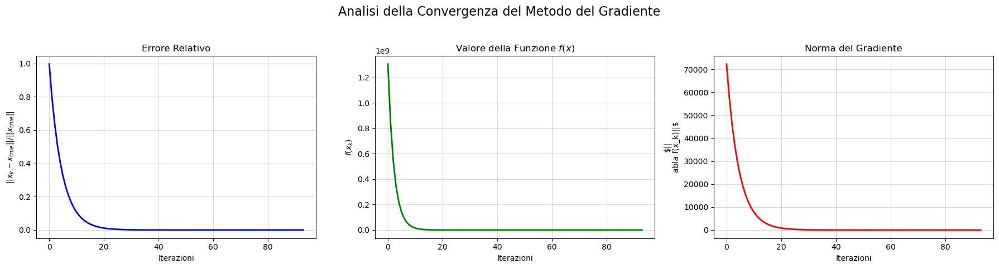

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [2.43809298e+02 1.08164915e+03 1.77008202e+03 9.30914839e+01
 4.44231418e+02 1.44639507e+03 1.66749196e+02 5.48693243e+01
 1.90742064e+02 1.57621420e+03 1.14281406e+02 1.53935252e+03
 1.84365559e+03 1.67208076e+03 5.13206051e+02 1.06270302e+03
 8.04883582e+02 1.42567465e+03 1.64267243e+03 4.33539361e+02
 5.61121274e+02 1.62197906e+03 1.18143318e+03 1.59185382e+03
 1.72836027e+03 1.39079417e+03 7.49088030e+02 5.65320545e+02
 1.04692047e+03 1.99215938e+03 3.29429493e+02 7.75971804e+02
 1.29160512e+03 1.99085090e+03 1.63351401e+03 1.82085210e+02
 9.28776754e+02 7.98086711e+02 1.43455905e+03 1.86209092e+03
 1.96017460e+03 2.00572973e+02 1.19542860e+03 1.71799835e+03
 4.98988100e+02 1.55610829e+03 1.30585210e+02 7.00751049e+02
 1.69737420e+02 1.91030996e+02 1.58685258e+03 9.30522363e+02
 5.69149201e+02 1.58947748e+03 5.79019139e+02 1.42969210e+02
 1.5840

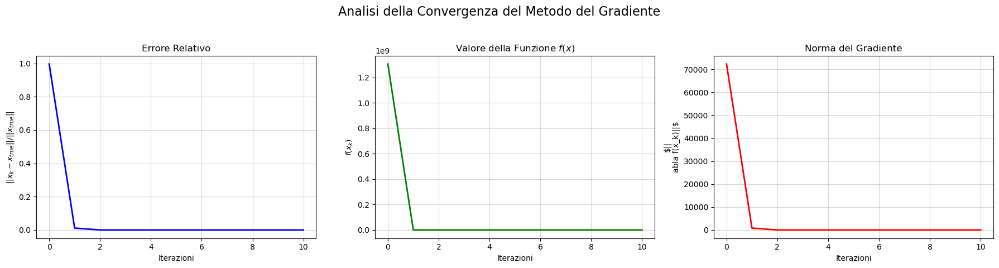

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [2.43809072e+02 1.08165033e+03 1.77008323e+03 9.30879711e+01
 4.44232074e+02 1.44639628e+03 1.66748041e+02 5.48620786e+01
 1.90741280e+02 1.57621541e+03 1.14278885e+02 1.53935374e+03
 1.84365679e+03 1.67208198e+03 5.13206844e+02 1.06270419e+03
 8.04884663e+02 1.42567586e+03 1.64267364e+03 4.33539992e+02
 5.61122138e+02 1.62198027e+03 1.18143437e+03 1.59185504e+03
 1.72836148e+03 1.39079539e+03 7.49089079e+02 5.65321416e+02
 1.04692164e+03 1.99216057e+03 3.29429782e+02 7.75972868e+02
 1.29160633e+03 1.99085209e+03 1.63351523e+03 1.82084305e+02
 9.28777890e+02 7.98087790e+02 1.43456026e+03 1.86209212e+03
 1.96017580e+03 2.00572316e+02 1.19542979e+03 1.71799956e+03
 4.98988868e+02 1.55610951e+03 1.30583232e+02 7.00752061e+02
 1.69736316e+02 1.91030216e+02 1.58685380e+03 9.30523501e+02
 5.69150077e+02 1.58947869e+03 5.79020028e+02 1.42967561e+02
 1.584

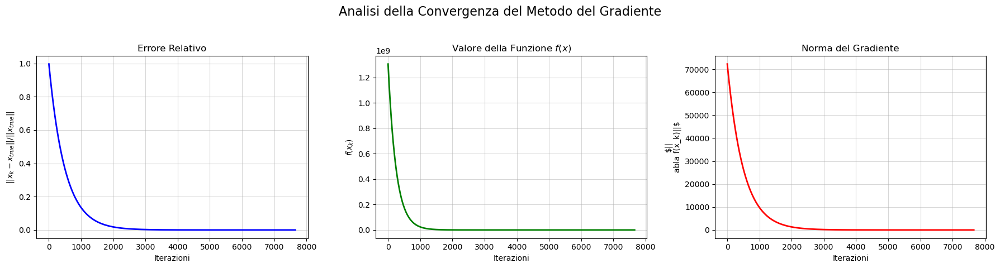

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)


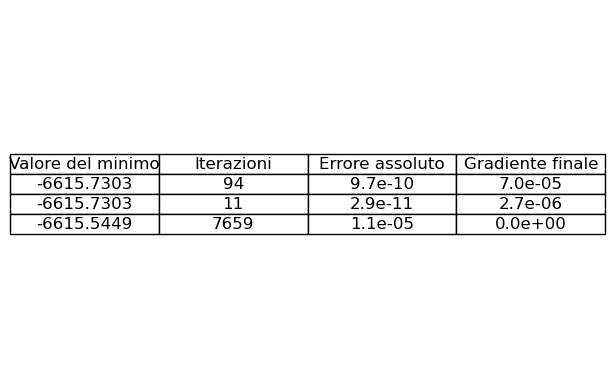

In [1448]:

x0 = np.array([0.0, 0.0])
plot_3d_universal(f_a, get_exact_solution_a(), xn = x0, title_prefix="Funzione A")
test(f_a, grad_f_a, df_i_a, x0 = x0, x_true=get_exact_solution_a(), alpha=0.1)
show_GD(f_a, grad_f_a, x0, get_exact_solution_a(), alpha=0.01)
show_GD(f_a, grad_f_a, x0, get_exact_solution_a(), alpha=1)

x0 = np.array([0.0, 0.0])
plot_3d_universal(f_b, get_exact_solution_b(), xn = x0, title_prefix="Funzione di Rosenbrock")
test(f_b, grad_f_b, df_i_b, x0, get_exact_solution_b(), alpha=0.01)
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.005)
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.001)
x0 = np.array([-1.2, 0.0])
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.001)


x0 = np.array([0.5, 1.0])
plot_3d_universal(f_c, get_exact_solutions_c(), xn = x0, title_prefix="Funzione multimodale")
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)
x0 = np.array([-0.5, -1.0])
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)
x0 = np.array([0.1, 0.2])
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)

f_d, grad_f_d, df_i_d, get_exact_solution_d, A_d, b_d, lam_d = setup_problem_d(2)
x0 = np.array([0.0, 0.0])
plot_3d_universal(f_d, get_exact_solution_d(), x0, title_prefix="Funzione minimi quadrati lineari")
test(f_d, grad_f_d, df_i_d, x0 = x0, x_true=get_exact_solution_d(), alpha=0.1)
f_d_5, grad_f_d_5, df_i_d_5, get_exact_solution_d_5, A_d_5, b_d_5, lam_d_5 = setup_problem_d(5)
print(f"Soluzione esatta: {get_exact_solution_d_5()}")
x0 = np.zeros(5)
x0 = np.random.uniform(0, 1, 5)
test(f_d_5, grad_f_d_5, df_i_d_5, x0 = x0, x_true=get_exact_solution_d_5(), alpha=0.01, n = 5, batch_size=2)

f_e, grad_f_e, df_i_e, get_exact_solution_e, A_e, b_e, lam_e = setup_problem_e(2)
x0 = np.array([0.0, 0.0])
plot_3d_universal(f_e, get_exact_solution_e(), x0, title_prefix="Funzione minimi quadrati con regolarizzazione")
test(f_e, grad_f_e, df_i_e, x0 = x0, x_true=get_exact_solution_e(), alpha=0.1)
f_e_5, grad_f_e_5, df_i_e_5, get_exact_solution_e_5, A_e_5, b_e_5, lam_e_5 = setup_problem_d(5)
print(f"Soluzione esatta: {get_exact_solution_e_5()}")
x0 = np.zeros(5)
x0 = np.random.uniform(0, 1, 5)
test(f_e_5, grad_f_e_5, df_i_e_5, x0, get_exact_solution_e_5(), alpha=0.01, n = 5, batch_size=2)


x0 = np.array([1.0, 1.0])
plot_3d_universal(f_f, get_exact_solution_f(2), x0, title_prefix="Funzione F")
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(2), alpha=0.1)
x0 = np.random.uniform(1, 10, 1000)
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(1000), alpha=0.1, n = 1000, batch_size= 10)
x0 = np.random.uniform(1, 10, 10000)
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(10000), alpha=0.1, n = 10000, batch_size= 10)

f_g, grad_f_g, df_i_g, get_exact_solution_g, B_g = setup_problem_g(2)
x0 = np.array([1.0, 1.0])
plot_3d_universal(f_g, get_exact_solution_g(), x0, title_prefix="Funzione G")
test(f_g, grad_f_g, df_i_g, x0 = x0, x_true=get_exact_solution_g(), alpha=0.1)
f_g_5, grad_f_g_5, df_i_g_5, get_exact_solution_g_5, B_g_5 = setup_problem_g(5)
x0 = np.random.uniform(0, 1, 5)
test(f_g_5, grad_f_g_5, df_i_g_5, x0 = x0, x_true=get_exact_solution_g_5(), alpha=0.1, n=5, batch_size=2)
x0 = np.random.uniform(0, 10, 1000)
f_g_1, grad_f_g_1, df_i_g_1, get_exact_solution_g_1, B_g_1 = setup_problem_g(1000)
test(f_g_1, grad_f_g_1, df_i_g_1, x0 = x0, x_true=get_exact_solution_g_1(), alpha=0.1, n=1000, batch_size=10)

